# Photonic Crystal Slab Template

## Configuration

In [1]:
## Define the materials
from phc_nzi.photonic_crystal_maker import (Material, Geometry, PhotonicCrystal, 
                                        ScriptParam, ScriptParamVector3, BaseDielectricDistribution,
                                        HexagonalLattice)
import phc_nzi.photonic_crystal_maker as phc_mkr
import meep as mp
from phc_nzi.mpb_configurator import *
from phc_nzi.simulation_handler import LSFJobConfiguration, MPBDataOptions, Simulation
from phc_nzi.optimization_data_analyzer import OptimizationDataAnalyzer
from phc_nzi.simulation_viewer import SimulationViewer
from phc_nzi.lsf_sweeper import LSFSweeper

import numpy as np
import matplotlib.pyplot as plt
import os
from matplotlib.patches import FancyArrow
from matplotlib.legend_handler import HandlerPatch
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
import joblib
from matplotlib.ticker import FormatStrFormatter, LogFormatterSciNotation, LogLocator
import matplotlib.colors as mcolors
import pandas as pd
from phc_nzi.mpi_bayesian_optimization import MPIBayesianOptimizator
import matplotlib.pyplot as plt
import phc_nzi.simulation_viewer as sv

# import tqdm for progress bars
from tqdm import tqdm
plt.rcParams["font.size"] = 15

no_hBN = 2.13
ne_hBN = 1.65

eps_hBN = (no_hBN**2, no_hBN**2, ne_hBN**2)
print("Epsilon of hBN slab", eps_hBN)

# Simulation Name: 
name = "C6v_hBN"
data_rooth = "/work3/enrva/phc_nzi_data/MPB_data"
if not os.path.exists(data_rooth):
    os.makedirs(data_rooth)


# Define the geometry
radius1 = ScriptParam("r1", 0.3)
radius2 = ScriptParam("r2", 0.2)
height_supercell = 3
height_slab = ScriptParam("h", 0.4)
slab_block_size = ScriptParamVector3(1e20, 1e20, "h", z_def=0.4)

# Define the lattice

lattice_2D = phc_mkr.HexagonalLattice()
lattice_slab = phc_mkr.HexagonalLattice(supercell_height=4)

k_points = lattice_2D.get_high_symmetry_k_points(centered_in_gamma=True)
distance = 0.1
k_points_around_gamma = lattice_2D.get_k_points_around_gamma(distance=distance)

print(k_points)

center = mp.Vector3(0,0,0)
dist = BaseDielectricDistribution(eps_bulk=eps_hBN, eps_atoms=1)
atoms_1 = dist.make_C6v_2b(radius=dist._radius1) 
atoms_2 = dist.make_C6v_6d(radius=dist._radius2, x_dist = phc_mkr.ScriptParam("x_dist", 0.15))
molecule_geometry = dist.make_superposition([atoms_1, atoms_2])
photonic_crystal_2D = PhotonicCrystal(lattice=lattice_2D, atoms=molecule_geometry)
crystal_symmetries = r"$C_{6v}:\;2b \oplus 6d$"
m1 = 2 
m2 = 6
def calculate_filling_factor(m1, m2, r1, r2, a=1):
    """
    Calculates the dielectric filling fraction for a 2D hexagonal lattice 
    """
    # Total area of pillars in the primitive cell
    atoms_area = np.pi * (m1*r1**2 + m2 * r2**2)
    # Area of the hexagonal unit cell (a^2 * sin(60 degrees))
    unit_cell_area = (np.sqrt(3) / 2) * (a**2)
    filling_fraction = (unit_cell_area-atoms_area) / unit_cell_area
    return filling_fraction

import numpy as np

def calculate_filling_factor_from_distribution(eps_grid, eps_th):
    """
    Calculates the filling factor from a dielectric distribution grid.
    
    Parameters:
    eps_grid (np.array): 2D array of epsilon values.
    eps_th (float): Threshold value (e.g., 1.5 if dielectric is 12 and air is 1).
    
    Returns:
    float: The filling factor f.
    """
    # Create a boolean mask where epsilon is greater than the threshold
    dielectric_mask = eps_grid > eps_th
    
    # Count the number of 'True' values and divide by total grid size
    filling_factor = np.sum(dielectric_mask) / eps_grid.size
    
    return filling_factor


dist_slab = BaseDielectricDistribution(eps_bulk=eps_hBN  , eps_atoms=1, height_slab=0.5)
atoms_1_slab = dist_slab.make_C6v_2b(radius=dist_slab._radius1)
atoms_2_slab = dist_slab.make_C6v_6d(radius=dist_slab._radius2, x_dist = phc_mkr.ScriptParam("x_dist", 0.25))
molecule_geometry_slab = dist_slab.make_superposition([atoms_1_slab, atoms_2_slab])
photonic_crystal_slab = PhotonicCrystal(lattice=lattice_slab, atoms=molecule_geometry_slab)

RESOLUTION = 33
PARITY_2D = "te"
POINT_GROUP = "C6v"
delta_k = 0.1
k_points_2D_optimized_values = [
    mp.Vector3(delta_k, 0, 0),                       # Point toward K
    mp.Vector3(0, 0, 0),                             # Gamma
    mp.Vector3(delta_k * np.cos(np.pi/6),            # Point toward M (30 deg)
               delta_k * np.sin(np.pi/6), 0)
]
k_points_2D_optimized_labels = [r"K $\leftarrow$", r"$\Gamma$", r"$\rightarrow$ M"]
k_points_2D_optimized = {"k_points_values": k_points_2D_optimized_values, "k_points_labels": k_points_2D_optimized_labels}

figure_path = os.path.abspath("/zhome/2f/7/202918/hBN/pics")  
if not os.path.exists(figure_path):
    os.makedirs(figure_path)

Using MPI version 4.1, 1 processes
Epsilon of hBN slab (4.536899999999999, 4.536899999999999, 2.7224999999999997)
{'k_points_values': [Vector3<-0.3333333333333333, 0.3333333333333333, 0.0>, Vector3<0.0, 0.0, 0.0>, Vector3<0.0, 0.5, 0.0>, Vector3<-0.3333333333333333, 0.3333333333333333, 0.0>], 'k_points_labels': ['K', '$\\Gamma$', 'M', 'K']}


In [2]:
# Dictionary of standard scientific plotting parameters
SINGLE_COLUMN_WIDTH = 3.3 # inches
DOUBLE_COLUMN_WIDTH = 6.9
GOLDEN_RATIO = 1.618  # Standard proportion for scientific plots
ROW_HEIGHT = SINGLE_COLUMN_WIDTH / GOLDEN_RATIO  # Approx 2.16 inches
publication_params = {
    # --- Figure Dimensions & Output ---
    "figure.figsize": (SINGLE_COLUMN_WIDTH, ROW_HEIGHT), # 3.5 inches is standard for a single-column width
    "figure.dpi": 300,              # High resolution for rasterized rendering
    "savefig.bbox": "tight",        # Prevents clipping of axis labels
    "savefig.pad_inches": 0.05,     # Removes excess white space margins
    
    # --- Fonts & Text ---
    "font.family": "serif",            # Standard for academic journals
    "font.serif": ["Times New Roman", "DejaVu Serif", "Computer Modern Roman"],
    "font.size": 8,                    # Set base font size to 9pt (perfect mid-range for 8-10pt rule)
    "axes.labelsize": 9,               # Axis label size
    "axes.titlesize": 9,               # Plot title size
    "xtick.labelsize": 8,              # X-axis tick label size (matches 8pt minimum)
    "ytick.labelsize": 8,              # Y-axis tick label size (matches 8pt minimum)
    "legend.fontsize": 8,              # Legend text size
    "axes.labelsize": 9,



    
    # --- Axes & Lines ---
    "axes.linewidth": 1.0,          # Thicker bounding box
    "lines.linewidth": 1.1,         # Thicker lines for visibility when printed
    "lines.markersize": 4,          # Clear, readable data markers
    
    # --- Ticks ---
    "xtick.direction": "in",        # Ticks point inward (standard in science)
    "ytick.direction": "in",
    "xtick.top": True,              # Top axis ticks visible
    "ytick.right": True,            # Right axis ticks visible
    "xtick.minor.visible": True,    # Enable minor ticks for precision
    "ytick.minor.visible": True,
    
    # --- Legend ---
    "legend.frameon": False,        # Remove the box around the legend to save ink
    
    # --- Mathtext / LaTeX ---
    "mathtext.fontset": "cm",       # Computer Modern for math rendering
    # "text.usetex": True,          # Uncomment if you have a local LaTeX engine installed!
}

# Apply the configurations globally
plt.rcParams.update(publication_params)


## 2D
### Unoptimized


In [3]:
SIMULATE = False
# r1 = 0.17
# r2 = 0.08
r1 = 0.1304
r2 =  0.08
x_dist = 0.25

In [4]:
## Define the simulation
configuration_options_2D_unoptimized = dict(
    resolution = RESOLUTION,
    num_bands=10,
    k_points=k_points["k_points_values"],
    k_points_interpolation_factor = 30,
    extra_runner_command = "fix-hfield-phase output-hfield output-efield display-symmetries-c6v",
)

mpb_configuration_2D_unoptimized=MPBSchemeConfigurator(
    photonic_crystal_2D, ["te", "tm"], **configuration_options_2D_unoptimized)

In [5]:
# Run or load the unoptimized 2D simulation to get the data for plotting
data_line = rf"$r_1={r1:0.3f}a$, $r_2={r2:0.3f}a$, $FF={calculate_filling_factor(3,6,r1, r2):0.3f}$ $\varepsilon={eps_hBN}$"

# make a new simulation just for this purpose, to avoid overwriting the original one with the new parameters
name_2D_unoptimized = name + "_2D_unoptimized"
simulation_2D_unoptimized = Simulation(
    simulation_name = name_2D_unoptimized,
    script = mpb_configuration_2D_unoptimized.get_scheme_config(join_newline=True),
    directory= os.path.join(data_rooth, name_2D_unoptimized)
    )
if SIMULATE is True:
    print("2D simulation started")
    simulation_2D_unoptimized.run_hpc(mpb_command_line_params=dict(r1 = r1, r2 = r2, x_dist = x_dist), mpi = False, version = "mpb-dev/1.11.2-dev")
    print("Done.")
print("Collecting results forom ", simulation_2D_unoptimized.directory)


COMMANDS ['(define-param h 1e+20)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.15)']


In [6]:

# Extract TM symmetry data
symmetry_results = simulation_2D_unoptimized.get_symmetry_by_parity(PARITY_2D)

if symmetry_results:
    print(f"{'Band':<6} | {'Irrep':<26} | Projections")
    print("-" * 80)
    for band, chars in symmetry_results.items():
        # 1. Compute the full projection set
        projections = simulation_2D_unoptimized.compute_projections(chars, group=POINT_GROUP)
        
        # 2. Identify the base label
        best_match = simulation_2D_unoptimized.identify_irrep(projections)
        max_proj = projections.get(best_match, 0.0)
        
        # 3. Handle formatting and confidence warnings entirely within the loop
        if max_proj < 0.85:
            label = f"{best_match} (Low Conf: {max_proj:.2f})"
        else:
            label = best_match
        
        # 4. Format the projections for display
        proj_str = ", ".join([f"{k}:{v:+.2f}" for k, v in projections.items() if abs(v) > 0.05])
        
        print(f"{band:<6} | {label:<26} | {proj_str}")

Band   | Irrep                      | Projections
--------------------------------------------------------------------------------
1      | A_2                        | A_2:+1.00
2      | B_1                        | B_1:+1.00
3      | E_1                        | A_1:-0.38, A_2:+0.38, B_1:+0.12, B_2:-0.12, E_1:+1.00
4      | E_1                        | A_1:+0.38, A_2:-0.38, B_1:-0.12, B_2:+0.12, E_1:+1.00
5      | A_2                        | A_2:+1.00
6      | E_2                        | A_1:+0.13, A_2:-0.13, B_1:-0.37, B_2:+0.37, E_2:+1.00
7      | E_2                        | A_1:-0.13, A_2:+0.13, B_1:+0.37, B_2:-0.37, E_2:+1.00
8      | B_2                        | B_2:+0.99
9      | A_2                        | A_2:+0.99
10     | E_2                        | A_1:+0.13, A_2:-0.13, B_1:-0.37, B_2:+0.37, E_2:+0.99


(64.72784308262747, 130.27215691737254, 46.93470473517699, 122.065295264823)

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


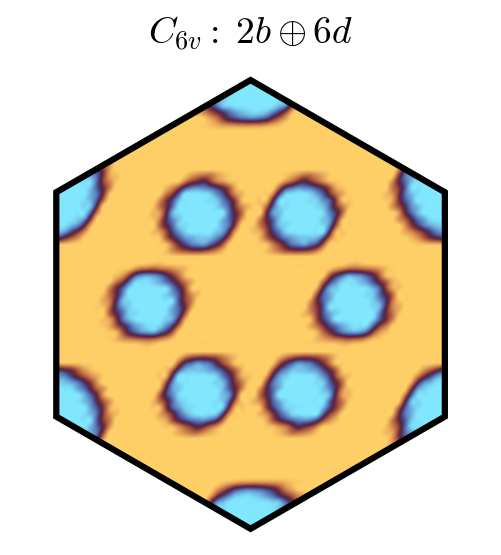

In [7]:
import phc_nzi.simulation_viewer as sv

# -- 2. TOP RIGHT PANEL: Crystal Structure
opt_3x3 = MPBDataOptions(rectify=True, periods=3, resolution=65)
eps_3x3 = simulation_2D_unoptimized.load_and_convert_epsilon_data(options=opt_3x3)
plt.figure()
# Plotting the dielectric distribution directly to avoid automatic colorbars/ticks
sv.plot_epsilon_on_ax(eps_3x3, lattice_type="hexagonal",padding=1.1, ws_lw = 1.5, interpolation = "spline36")

plt.xticks([]),
plt.title(crystal_symmetries)
ax = plt.gca()
plt.xlabel([])
plt.ylabel([])  
ax.set_box_aspect(1)
ax.axis('off')

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


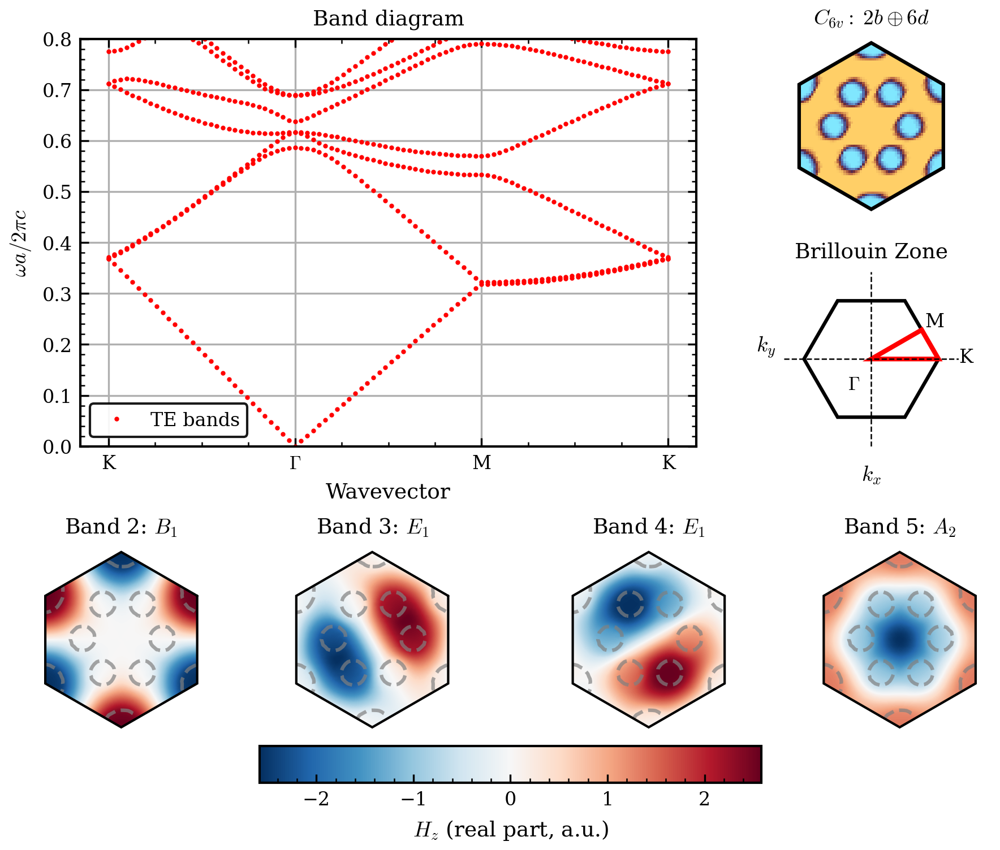

In [8]:
# Plot the band diagram and the unit cell
df = simulation_2D_unoptimized.load_frequency_data(PARITY_2D)
df_target_idx = df.loc[(df["k1"] == 0) & (np.abs(df["k2"]) == 0), "k1"].idxmin()
k_idx_for_field_plot = df.loc[df_target_idx, "k index"]
plot_options = dict(linestyle='', marker='o', markersize=1)

# Create a figure with a custom grid layout
fig = plt.figure(figsize=(6, 5),constrained_layout=True)
gs = gridspec.GridSpec(2, 1, figure=fig, height_ratios=[3,2])
gs_top = gridspec.GridSpecFromSubplotSpec(2,3, subplot_spec=gs[0, :], wspace=0.1)
gs_bottom = gridspec.GridSpecFromSubplotSpec(2,4, subplot_spec=gs[1, :], wspace=0.1, height_ratios = [1,0.2])

# Add 4 axis for fields in the gs_bottom first row
axes_fields = []
for i in range(4):
    ax_field = fig.add_subplot(gs_bottom[0, i])
    axes_fields.append(ax_field)
cax = fig.add_subplot(gs_bottom[1,1:3])

# -- 1. LEFT PANEL: Band Diagram --
ax_band = fig.add_subplot(gs_top[:, 0:2])
plt.sca(ax_band) # Set current axis for the viewer
plot_options = dict(linestyle='', marker='o', markersize=1)

viewer_2D = sv.SimulationViewer(simulation_2D_unoptimized)
# viewer_2D.plot_band_diagram("tm", k_points_path=k_points, color="blue", plot_options=plot_options)
viewer_2D.plot_band_diagram(PARITY_2D, k_points_path=k_points, color="red", plot_options=plot_options)
ax_band.set_ylabel(r"$\omega a/2\pi c$")
ax_band.set_title("Band diagram")
plt.ylim(0,0.8)
ymin, ymax = ax_band.get_ylim()
# ax_band.vlines(k_idx_for_field_plot, ymin, ymax, colors="gray", linestyles="--", label=None)


# -- 2. TOP RIGHT PANEL: Crystal Structure
ax_lat = fig.add_subplot(gs_top[0, 2])
plt.sca(ax_lat)
sv.plot_epsilon_on_ax(eps_3x3, lattice_type="hexagonal", ws_lw = 1.5, padding = 1.1)
plt.xticks([])
plt.yticks([])
plt.title(crystal_symmetries)
plt.xlabel([])
plt.ylabel([])  
ax_lat.set_box_aspect(1)
ax_lat.axis('off')


# --3. BOTTOM LEFT PANEL: Brillouin Zone with IBZ highlighted
ax_bz = fig.add_subplot(gs_top[1, 2])
# Define Hexagon vertices (Pointy-topped to match your K-vector on x-axis)
angles = np.linspace(0, 2*np.pi, 7)
hexagon_vertices = [[np.cos(a), np.sin(a)] for a in angles]
bz_hexagon = patches.Polygon(hexagon_vertices, fill=False, edgecolor='black', linewidth=1.5)
ax_bz.add_patch(bz_hexagon)

# Define Irreducible Brillouin Zone (IBZ) triangle: Gamma -> K -> M
m_x, m_y = np.cos(np.pi/6) * (np.sqrt(3)/2), np.sin(np.pi/6) * (np.sqrt(3)/2)
ibz_vertices = [[0, 0], [1, 0], [m_x, m_y]]
ibz_triangle = patches.Polygon(ibz_vertices, closed=True, fill=False, alpha=1, edgecolor='red', linewidth=2)
ax_bz.add_patch(ibz_triangle)

# Add crosshair lines through the origin
ax_bz.axhline(0, color='black', linewidth=0.6, linestyle='--')
ax_bz.axvline(0, color='black', linewidth=0.6, linestyle='--')

# Add High-Symmetry point labels
ax_bz.text(-0.35, -0.45, r'$\Gamma$',)
ax_bz.text(1.3, -0.05, 'K',)    
ax_bz.text(m_x + 0.05, m_y + 0.05, 'M', )

# Format axes
limit = 1.3
ax_bz.set_xlim(-limit, limit)
ax_bz.set_ylim(-limit, limit)
ax_bz.set_box_aspect(1)
for spine in ax_bz.spines.values():
    spine.set_visible(False)
ax_bz.tick_params(which='both', bottom=False, top=False, left=False, right=False)
ax_bz.set_xticklabels([])
ax_bz.set_yticklabels([])
ax_bz.grid(False) 
ax_bz.set_xlabel(r"$k_x$")
ax_bz.set_ylabel(r"$k_y$", rotation=0)
ax_bz.set_title("Brillouin Zone")

eps = simulation_2D_unoptimized.load_and_convert_epsilon_data(options=MPBDataOptions(rectify=False))
calculate_filling_factor_from_distribution(eps, (1 + no_hBN**2)/2)



# --4. Field Plots

# Plot the eigen fields 
for ax in axes_fields: 
    ax.set_axis_off()
band_indices = [2,3, 4, 5]


# data loading
conv_opt = MPBDataOptions(rectify=True, periods=3, transpose=False, resolution=65)
loaded_fields = {}
global_vmax = 0
try:
    eps_data = simulation_2D_unoptimized.load_and_convert_epsilon_data(options=conv_opt)
except Exception:
    eps_data = None
for b_idx in band_indices:
    fz = simulation_2D_unoptimized.load_and_convert_field_data(
        k_idx_for_field_plot, b_idx, "z", PARITY_2D, "h" if PARITY_2D == "te" else "e", conversion_options=conv_opt, overwrite=True)
    loaded_fields[b_idx] = {'z': fz, 'x': None, 'y': None}
    
    local_max = np.max(np.abs(np.real(fz)))
    if local_max > global_vmax:
        global_vmax = local_max

# Identify the Irrep of these modes
irreps = simulation_2D_unoptimized.identify_irrep_by_band_indices(band_indices, PARITY_2D, POINT_GROUP)

# Plot fields 
for ax, b_idx, irrep in zip(axes_fields, band_indices, irreps):
    data = loaded_fields[b_idx]
    im = sv.plot_field_quiver_on_ax(        
        field_z=data['z'],
        field_x=data['x'],
        field_y=data['y'],
        eps_data=eps_data,
        ax = ax, 
        lattice_type="hexagonal",
        step = 5,
        ws_lw = 1,
        padding = 1.1,
    )
    ax.set_title(f"Band {b_idx}: ${irrep}$")
    ax.set_box_aspect(1)



cbar = fig.colorbar(im, cax=cax, orientation='horizontal') 
cbar.set_label(r"$H_{z}$ (real part, a.u.)")
plt.show()

### Optimization


In [9]:
def run_simulation_task(entry, which_sim = "sim", which_param_1 = "r1", which_param_2 = "r2", mpi = False, version = "mpb-dev/1.11.2-dev"):
    return entry[which_sim].run_hpc(
        mpb_command_line_params=dict(r1=entry[which_param_1], r2=entry[which_param_2], x_dist = 0.25), 
        mpi=mpi, 
        version=version
    )

# Gamma-only configuration (for optimization)
config_gamma_degeneracy = dict(
    resolution=RESOLUTION,
    num_bands=8,
    k_points=[mp.Vector3(0, 0, 0)],
    extra_runner_command = "display-symmetries-c6v",
)
mpb_config_gamma_degeneracy= MPBSchemeConfigurator(photonic_crystal_2D, [PARITY_2D], **config_gamma_degeneracy)
script_gamma_degeneracy = mpb_config_gamma_degeneracy.get_scheme_config(join_newline=True)


def run_sweeper_and_analyze(entry, n_r2_sweep, b_idx_top, b_idx_bot):
    
    try:
        data_old = entry["sim"].load_frequency_data(PARITY_2D)
        # Calculate gaps at Gamma (k=0)
        # Note: Ensuring we only look at k=0 if your sweep contains multiple k-points
        gamma_data = data_old[(data_old['k1'] == 0) & (data_old['k2'] == 0)]
        gap = (gamma_data[f'{PARITY_2D} band {b_idx_top}'] - gamma_data[f'{PARITY_2D} band {b_idx_bot}']).abs().values[0]
        entry["gap"] = gap
        sw = entry['sweeper']
        
        # Load or Run
        if SIMULATE:
            sw.run() 
            
        # Data Extraction
        data = sw.data if len(sw.data) > 0 else sw.load_df()
        data = sw.data if len(sw.data) > 0 else sw.load_df()

        gaps = (data[f'band_{b_idx_top}'] - data[f'band_{b_idx_bot}']).abs().values

        best = int(np.argmin(gaps))
        r2_corr = entry['r2_sweep'][best]

        # Update entry with results
        entry['gap_corrected'] = gaps[best]
        entry['r2_corrected'] = r2_corr
        entry['delta_r2'] = r2_corr - entry['r2']
        entry['edge_warning'] = (best == 0 or best == n_r2_sweep - 1)

        
        return None, None
    except Exception as e:
        return None, f"Error at r1={entry['r1']}: {str(e)}"


# Configurations for linearity analysis
configuration_options = dict(
    resolution = RESOLUTION,
    num_bands=8,
    k_points=k_points_2D_optimized["k_points_values"],
    k_points_interpolation_factor = 20,
    extra_runner_command = "fix-hfield-phase output-hfield output-efield display-symmetries-c6v display-group-velocities",
)

mpb_configuration=MPBSchemeConfigurator(
    photonic_crystal_2D, [PARITY_2D], **configuration_options)

script = mpb_configuration.get_scheme_config(join_newline=True)

COMMANDS ['(define-param h 1e+20)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.15)']
COMMANDS ['(define-param h 1e+20)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.15)']


#### Bands A_2 E_1

##### Find degeneracy points

In [10]:
SIMULATE = False

In [11]:
# Run Bayesian Optimization
numproc = 30
lsf_config = LSFJobConfiguration(num_processors=numproc, span_option="ptile", span_value=4, queue="hpc",   mem = "1GB")
# NOTE: Higher kappa values in LCB acquisition function encourage exploration, which can be beneficial in early optimization stages or when the objective landscape is complex. 
# Adjust based on observed convergence behavior.
N_LHS = 3
N_BO = 3
bo_options = {
    "dimensions": [(0.07, 0.25), (0.01, 0.1)],
    "acq_func": "LCB",
    "acq_func_kwargs": {"kappa": 3.5},
    "n_initial_points": numproc * N_LHS,
    "initial_point_generator": "sobol",
    "random_state": 42
}

optimizer_A2_E1 = MPIBayesianOptimizator(
    simulation_name=name + "_BO_A2_E1",
    scheme_script=script_gamma_degeneracy,
    directory=os.path.join(data_rooth, name + "_BO_A2_E1"),
    maxiter=N_LHS+N_BO, 
    batch_size=numproc,
    param_names=["r1", "r2"],
    polarization=PARITY_2D,
    symmetry_group=POINT_GROUP,
    target_irreps=["A_2", "E_1", "E_1"], 
    irrep_occurrences=[1, 1, 1],
    bo_options=bo_options,
    fixed_params = {"x_dist": 0.25},
    objective_mode = "log",
    target_cost = 0.0025,
    strategy = "cl_min"
)
if SIMULATE is True:
    optimizer_A2_E1.erease_data_file()
    optimizer_A2_E1.submit_lsf_job(lsf_config, conda_env_name="mpb-nzi-env")

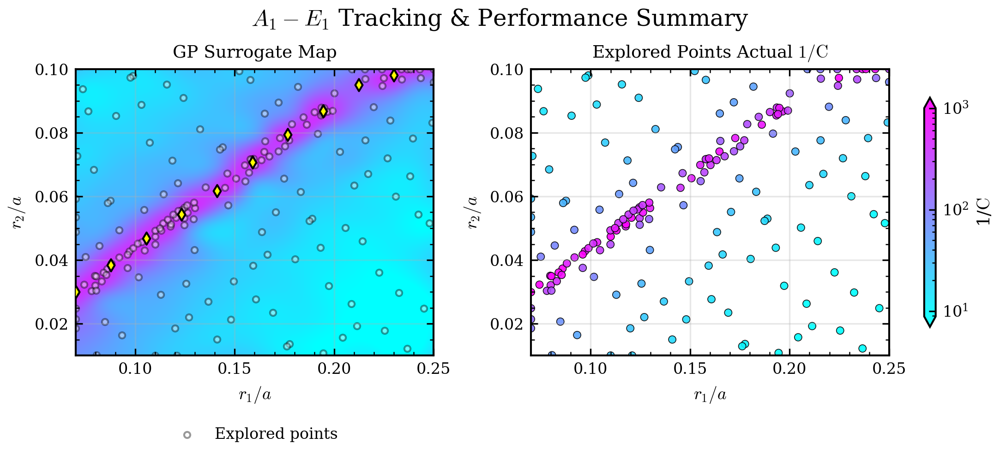

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patheffects as pe
from matplotlib.ticker import FormatStrFormatter, LogLocator, LogFormatterSciNotation
import joblib
import os

import phc_nzi.simulation_viewer as sv

# =================================================================
# CONFIGURATION SWITCH: Set to "log" or "linear" depending on the run
# =================================================================
OBJECTIVE_MODE = "log"  


# 1. Load Data and Optimizer
analyzer = OptimizationDataAnalyzer(optimizer_A2_E1.data_file)
analyzer.load_data()
loaded_optimizer = joblib.load(optimizer_A2_E1.model_file)

# Prepare predictions from the GP
gp_model = loaded_optimizer.models[-1]
valid = (analyzer.cost_vals > 0) & (~np.isnan(analyzer.cost_vals))
X_train = np.c_[analyzer.param1_vals[valid], analyzer.param2_vals[valid]]
fom_train = 1.0 / analyzer.cost_vals[valid]  # Calculate 1/C for explored points

# Setup grids for the map
r1_grid = np.linspace(0.07, 0.25, 200)
r2_grid = np.linspace(0.01, 0.1, 200)
R1, R2 = np.meshgrid(r1_grid, r2_grid)
grid_points = np.c_[R1.ravel(), R2.ravel()]

grid_points_transformed = loaded_optimizer.space.transform(grid_points)
gp_predictions = gp_model.predict(grid_points_transformed)

# --- DYNAMIC SCALE CONVERSION ---
if OBJECTIVE_MODE == "log":
    predicted_cost = 10**gp_predictions
else:
    predicted_cost = gp_predictions

# Calculate the Figure of Merit cleanly on a linear scale
predicted_cost_safe = np.clip(predicted_cost, a_min=1e-6, a_max=None)
Predicted_FOM_2D = (1.0 / predicted_cost_safe).reshape(R1.shape)

# --- FIND 10 OPTIMAL SAMPLES FOR 0.05 < r1 < 0.14 ---
r1_samples_1 = np.linspace(0.07, 0.23, 10)
optimal_r2_points_1 = []
r2_search = np.linspace(0.03, 0.1, 500)

for r1_val in r1_samples_1:
    test_points = np.c_[np.full(len(r2_search), r1_val), r2_search]
    test_transformed = loaded_optimizer.space.transform(test_points)
    
    # np.argmin works identically for both linear cost and log10(cost)
    # because log10 is a strictly monotonic function!
    costs_pred = gp_model.predict(test_transformed)
    best_r2 = r2_search[np.argmin(costs_pred)]
    optimal_r2_points_1.append([r1_val, best_r2])

branch_1 = np.array(optimal_r2_points_1)

# VMIN AND VMAX FROM PERCENTILES
vmin, vmax = np.percentile(Predicted_FOM_2D, [5, 99])
vmax = 1e3
log_norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)

# ---------------------------------------------------------
# Initialize Figure with 2 Subplots (Spatial 2D layouts)
# ---------------------------------------------------------
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7.2, 3.2), layout="constrained")
fig.suptitle(r"$A_1-E_1$ Tracking & Performance Summary", fontsize=12)

# --- LEFT PLOT: GP Surrogate Map ---
levels = np.logspace(np.log10(vmin), np.log10(vmax), 200)
heatmap = ax1.contourf(R1, R2, Predicted_FOM_2D, levels=levels, cmap="cool", norm=log_norm, extend='both')

# Plot Sampled Points (Training data placeholder dots)
ax1.scatter(X_train[:, 0], X_train[:, 1], c='white', edgecolors='black', 
           s=10, alpha=0.4, label="Explored points")

# Plot the Optimal Samples extracted from the GP
ax1.scatter(branch_1[:, 0], branch_1[:, 1], 
           color='yellow', marker='d', s=20, edgecolors='black', 
           label=None, zorder=15)

ax1.set_xlabel("$r_1/a$")
ax1.set_ylabel("$r_2/a$")
ax1.set_title("GP Surrogate Map")
ax1.grid(alpha=0.3)
ax1.set_xlim(0.07, 0.25)
ax1.set_ylim(0.01, 0.1)

ax1.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax1.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax1.legend(loc='lower center', bbox_to_anchor=(0.5, -0.35), ncol=1, framealpha=0.95, edgecolor='black')


# --- RIGHT PLOT: 2D Scatter of Explored Points (Same Map Space) ---
# X_train[:, 0] is r1, X_train[:, 1] is r2. Colored by fom_train (1/C)
scatter2 = ax2.scatter(X_train[:, 0], X_train[:, 1], c=fom_train, 
                       cmap="cool", norm=log_norm, edgecolors='black', 
                       linewidths=0.4, s=15, alpha=0.9)

ax2.set_xlabel("$r_1/a$")
ax2.set_ylabel("$r_2/a$")
ax2.set_title("Explored Points Actual $1/\mathrm{C}$")
ax2.grid(alpha=0.3)
ax2.set_xlim(0.07, 0.25)
ax2.set_ylim(0.01, 0.1)  # Matches the y-limits of the meshgrid/left plot

# Formatting ticks for right plot
ax2.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax2.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))


# --- COLORBAR SETUP (Attached to ax2 on the far right) ---
cbar = fig.colorbar(scatter2, ax=ax2, extend='both', fraction=0.046, pad=0.05, shrink=0.8, format=LogFormatterSciNotation())
cbar.set_label(r"1/$\mathrm{C}$")
cbar.locator = LogLocator(base=10.0, numticks=6)
cbar.update_ticks()
cbar.ax.yaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(2, 10), numticks=12))

plt.show()

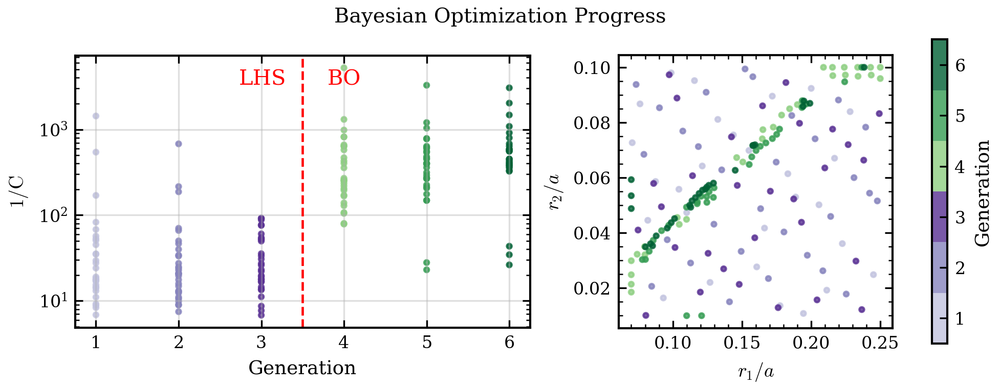

In [13]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.ticker import MultipleLocator, NullLocator

# Load data
analyzer.load_data()  
df = analyzer.get_points_above_treshold(0)

# Count generations from 1 instead of 0
if df["Gen"].min() == 0:
    df["Gen"] = df["Gen"] + 1

s = 5

# Determine strictly integer min and max generations
min_gen = int(df["Gen"].min())
max_gen = int(df["Gen"].max())

num_lhs = int(N_LHS - min_gen + 1)
num_bo = int(max_gen - N_LHS)


colors_lhs = plt.get_cmap("Purples")(np.linspace(0.35, 0.85, num_lhs))
colors_bo = plt.get_cmap("YlGn")(np.linspace(0.45, 0.9, num_bo))
combined_colors = np.vstack([colors_lhs, colors_bo])
cmap = mcolors.ListedColormap(combined_colors)
boundaries = np.arange(min_gen - 0.5, max_gen + 1.5, 1)
norm = mcolors.BoundaryNorm(boundaries, ncolors=len(combined_colors))

# Set the width ratio to 1.66 : 1 to compensate for the 0.6 : 1.0 box aspect ratios.
fig, (ax1, ax2, cax) = plt.subplots(
    1, 3, 
    figsize=(6.5, 2.5), 
    layout="constrained",
    gridspec_kw={'width_ratios': [1.66, 1, 0.2]}
)
fig.suptitle("Bayesian Optimization Progress")

# --- LEFT PLOT ---
ax1.scatter(df["Gen"], 1/(df["cost"]), c=df["Gen"], cmap=cmap, norm=norm, s=s, alpha=0.8)

ax1.set_xlabel("Generation")
ax1.set_ylabel(r"$1/\mathrm{C}$")
ax1.set_yscale('log')
ax1.grid(alpha=0.4)

ax1.xaxis.set_major_locator(MultipleLocator(1))
ax1.xaxis.set_minor_locator(NullLocator())

ax1.axvline(N_LHS+0.5, color='red', linestyle='--')
ax1.text(N_LHS+0.3, 0.95, "LHS", ha='right', va='top', fontsize=10, 
        color='red', transform=ax1.get_xaxis_transform())
ax1.text(N_LHS+0.8, 0.95, "BO", ha='left', va='top', fontsize=10, 
        color='red', transform=ax1.get_xaxis_transform())

ax1.set_box_aspect(0.6)

# --- RIGHT PLOT ---
scatter = ax2.scatter(df["r1"], df["r2"], c=df["Gen"], cmap=cmap, norm=norm, s=s, alpha=0.8)
ax2.set_box_aspect(1)

# Attach colorbar to the figure, specifying it belongs to ax2
cbar = fig.colorbar(scatter, cax=cax, label="Generation", shrink=0.6)
cbar.set_ticks(np.arange(min_gen, max_gen + 1))
cbar.ax.yaxis.set_minor_locator(NullLocator())

ax2.set_xlabel("$r_1/a$")
ax2.set_ylabel("$r_2/a$")

cax.set_box_aspect(20)

plt.show()

In [14]:
import os
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm.auto import tqdm

# --- 1. Prevent HDF5 locking collisions ---
os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"
name_2D_optimized = name + "_2D_optimized"
# Initialize the entries
# For these entries the band gap is almost closed but is better to fine tune the parameters
entries_branch_1 = []
for pt in branch_1:
    r1, r2 = pt
    folder_name = name_2D_optimized + "_r1_{r1:.3f}_r2_{r2:.3f}".format(r1=r1, r2=r2)
    sim = Simulation(
        simulation_name=folder_name,
        script=script,
        directory=os.path.join(data_rooth, folder_name)
    )
    entries_branch_1.append({
        "r1": r1,
        "r2": r2,
        "sim": sim
    })


# Execute concurrently
if SIMULATE is True:
    # Set worker count (adjust based on your machine's capabilities)
    N_WORKERS = 20
    
    with ThreadPoolExecutor(max_workers=N_WORKERS) as executor:
        # Create a dictionary mapping futures to entries
        futures = {executor.submit(run_simulation_task, entry): entry for entry in entries_branch_1}
        
        # Wrap the completion generator with tqdm for the progress bar
        for future in tqdm(as_completed(futures), total=len(futures), desc="Running Simulations"):
            entry = futures[future]
            try:
                future.result() 
            except Exception as e:
                # Use tqdm.write to avoid breaking the progress bar visually
                tqdm.write(f"Simulation failed for r1={entry['r1']}, r2={entry['r2']}: {e}")


# Display the irreps for the target bands so that we can make sure to close the gap 
# between the correct bands in the next optimization iteration
for entry in entries_branch_1:
    sim = entry["sim"]
    irreps = sim.identify_irrep_by_band_indices([2,3,4,5,6,7], PARITY_2D, POINT_GROUP)
    entry["irreps"] = irreps
    print(f"r1={entry['r1']:.3f}, r2={entry['r2']:.3f} -> Irreps: {irreps}")


r1=0.070, r2=0.030 -> Irreps: ['B_1', 'A_2', 'E_1', 'E_1', 'E_2', 'E_2']
r1=0.088, r2=0.038 -> Irreps: ['B_1', 'E_1', 'E_1', 'A_2', 'E_2', 'E_2']
r1=0.106, r2=0.047 -> Irreps: ['B_1', 'E_1', 'E_1', 'A_2', 'E_2', 'E_2']
r1=0.123, r2=0.054 -> Irreps: ['B_1', 'A_2', 'E_1', 'A_2', 'E_2', 'E_2']
r1=0.141, r2=0.062 -> Irreps: ['B_1', 'A_2', 'E_1', 'E_1', 'E_2', 'E_2']
r1=0.159, r2=0.071 -> Irreps: ['B_1', 'E_1', 'A_2', 'E_1', 'E_2', 'E_2']
r1=0.177, r2=0.079 -> Irreps: ['B_1', 'E_1', 'E_1', 'A_2', 'E_2', 'E_2']
r1=0.194, r2=0.087 -> Irreps: ['B_1', 'E_1', 'A_2', 'E_1', 'E_2', 'E_2']
r1=0.212, r2=0.095 -> Irreps: ['B_1', 'E_1', 'E_1', 'A_2', 'E_2', 'E_2']
r1=0.230, r2=0.098 -> Irreps: ['B_1', 'E_1', 'E_1', 'A_2', 'E_2', 'E_2']


Sweeping r2 for 10 entries (SIMULATE=False)


Refining Degeneracy:   0%|          | 0/10 [00:00<?, ?it/s]

[False, False, False, False, False, False, False, False, False, False]


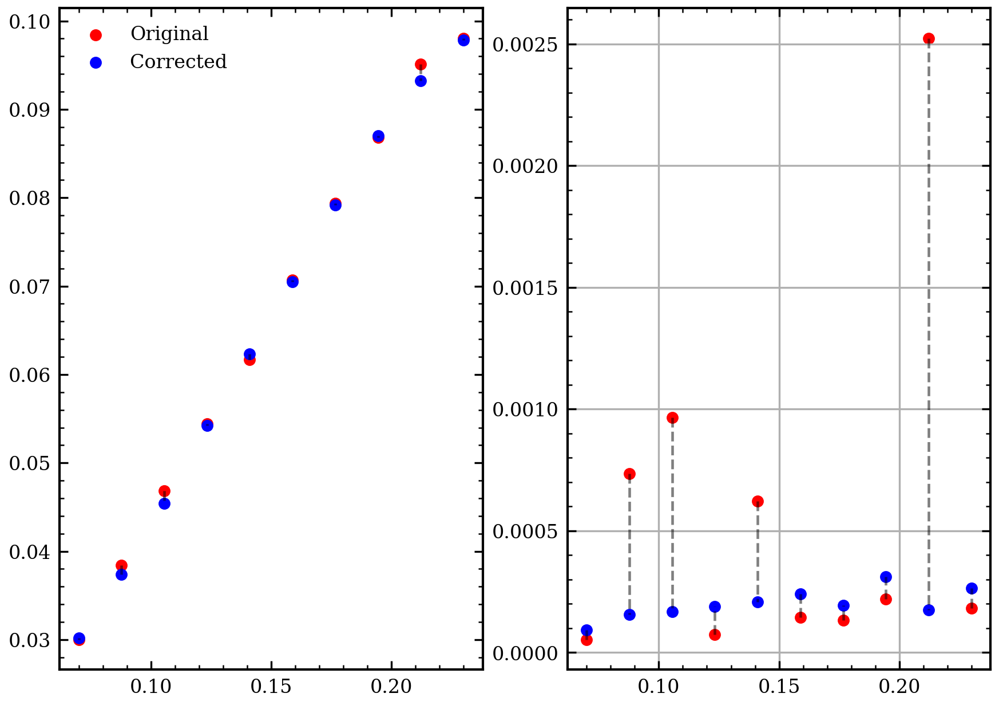

In [15]:
import time
import pandas as pd
import numpy as np
import os
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm.auto import tqdm 
from phc_nzi.sweeper import ParamSweeper

entries = entries_branch_1
for entry in entries:
    entry["target_b_idxes"] = [3,4,5]

n_r2_sweep = 50          # number of r2 values per point
r2_half_width = 0.01     # search range: r2_original ± this
N_WORKERS = 32           # number of sweepers to run in parallel

# Prepare entries with sweepers
for i, entry in enumerate(entries_branch_1):
    r1_i = entry['r1']
    r2_orig = entry['r2']
    r2_lo, r2_hi = (r2_orig - r2_half_width), (r2_orig + r2_half_width)
    r2_sweep = np.linspace(r2_lo, r2_hi, n_r2_sweep)
    
    folder_name = f"{name_2D_optimized}_r1_{r1_i:.3f}_r2_{r2_orig:.3f}_deg"
    
    sim_deg = Simulation(
        simulation_name=folder_name,
        script=script_gamma_degeneracy,
        directory=os.path.join(data_rooth, folder_name)
    )
    
    entry['sweeper'] = ParamSweeper(
        simulation=sim_deg,
        param_name="r2",
        values=r2_sweep.tolist(),
        polarization=PARITY_2D,
        bands=entry["target_b_idxes"],
        other_command_line_params={"r1": r1_i, "x_dist": 0.25}
    )
    entry['r2_sweep'] = r2_sweep
    entry['idx'] = i

# --- 3. PARALLEL EXECUTION ---

print(f"Sweeping r2 for {len(entries)} entries (SIMULATE={SIMULATE})")

with ThreadPoolExecutor(max_workers=N_WORKERS) as pool:
    # Submit tasks
    future_to_entry = {pool.submit(run_sweeper_and_analyze, e, n_r2_sweep, np.max(e["target_b_idxes"]), np.min(e["target_b_idxes"])): e for e in entries}
    # Progress bar
    with tqdm(total=len(entries), desc="Refining Degeneracy") as pbar:
        for fut in as_completed(future_to_entry):
            res, error = fut.result()
            if error:
                tqdm.write(f"Error: {error}")
            pbar.update(1)

plt.figure(figsize=(7,5))
plt.subplot(1, 2, 1)
for i, entry in enumerate(entries):
    plt.scatter(entry['r1'], entry['r2'], c= "r", label=f"Original" if i == 0 else None)
    plt.scatter(entry['r1'], entry['r2_corrected'], c="b", label=f"Corrected " if i==0 else None)
    plt.plot([entry['r1'], entry['r1']], [entry['r2'], entry['r2_corrected']], 'k--', alpha=0.5, label = None)
    plt.legend()

plt.subplot(1, 2, 2)
for entry in entries:
    plt.scatter(entry['r1'], entry['gap'], c= "r", label=None)
    plt.scatter(entry['r1'], entry['gap_corrected'], c="b", label=None)
    plt.plot([entry['r1'], entry['r1']], [entry['gap'], entry['gap_corrected']], 'k--', alpha=0.5, label = None)
    plt.yscale("linear")
    plt.grid(True)
print([e["edge_warning"] for e in entries])

In [16]:
import os
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm.auto import tqdm

# --- 1. Prevent HDF5 locking collisions ---
os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"

# --- 2. Prepare entries with UNIQUE directories ---
for entry in entries:
    r1_val = entry['r1']
    r2_val = entry['r2_corrected']
    
    # Generate a unique folder for each thread to prevent file locks
    unique_folder = f"{name_2D_optimized}_r1_{r1_val:.3f}_r2_{r2_val:.3f}_corr"
    
    sim = Simulation(
        simulation_name=unique_folder,
        script=script, 
        directory=os.path.join(data_rooth, unique_folder)
    )
    entry["sim_corrected"] = sim

# --- 3. Execute concurrently with Threads ---
if SIMULATE is True:
    # Set worker count (adjust this if 32 is too heavy for your RAM)
    N_WORKERS = 32
    
    with ThreadPoolExecutor(max_workers=N_WORKERS) as executor:
        # Create a dictionary mapping futures to entries
        futures = {
            executor.submit(run_simulation_task, entry, "sim_corrected", "r1", "r2_corrected"): entry 
            for entry in entries
        }
        
        # Wrap the completion generator with tqdm for the progress bar
        for future in tqdm(as_completed(futures), total=len(futures), desc="Running Corrected Sims"):
            entry = futures[future]
            try:
                future.result() 
            except Exception as e:
                # Use tqdm.write to avoid breaking the progress bar visually
                tqdm.write(f"Simulation failed for r1={entry['r1']}, r2={entry['r2_corrected']}: {e}")



In [17]:
def extract_group_velocity(self, which_parity:str, k_idx:int, b_idx:int):
    """
    Extracts the group velocity vector for a specific k-point and band from an MPB log file.
    
    Parameters:
        filepath (str): Path to the MPB output log file.
        which_parity (str): either "te" "tm" "zeven" "zodd"
        k_idx (int): The 1-based index of the k-point (as printed in the file).
        b_idx (int): The 1-based index of the band.
        
    Returns:
        tuple: (v_x, v_y, v_z) as floats, or None if not found.
    """
    filepath = os.path.join(self.directory, self.output_filename)
    with open(filepath, 'r') as file:
        for line in file:
            # Look for lines containing the velocity data
            if line.startswith(f"{which_parity}velocity:,"):
                parts = line.strip().split(',')
                
                # parts[0] is the prefix, parts[1] is the k_idx
                current_k_index = int(parts[1].strip())
                
                if current_k_index == k_idx:
                    # The band vectors start at index 2. 
                    # So, Band 1 -> parts[2], Band 2 -> parts[3], etc.
                    try:
                        vector_str = parts[b_idx + 1].strip()
                    except IndexError:
                        raise ValueError(f"Band {b_idx} not found for k-point {k_idx}.")
                    
                    # Clean the string: remove '#(' and ')' then split by spaces
                    vector_str = vector_str.replace("#(", "").replace(")", "").strip()
                    v_x, v_y, v_z = vector_str.split()
                    
                    return float(v_x), float(v_y), float(v_z)
                    
    print(f"k-point {k_idx} not found in the file.")
    return None



vgs = []
ffs = []
df = entries[0]["sim_corrected"].load_frequency_data(PARITY_2D)
gamma_idx = df.loc[(df["k1"] == 0) & (df["k2"] == 0), "k index"].iloc[0]
k_vg_idx = gamma_idx - 1
for entry in entries:
    try:
        r1 = entry["r1"]
        r2 = entry["r2_corrected"]
        eps = entry["sim_corrected"].load_and_convert_epsilon_data(MPBDataOptions(rectify=False))
        # Compute the filling fraction where eps>1.2 vs total area of eps
        filling_fraction = calculate_filling_factor_from_distribution(eps, (1.5))
        vg = extract_group_velocity(entry["sim_corrected"],PARITY_2D,k_idx=k_vg_idx, b_idx=np.max(entry["target_b_idxes"]))
        entry["group_velocity"] = vg
        vgs.append(np.sqrt(vg[0]**2 + vg[1]**2 + vg[2]**2))
        entry["filling_factor"] = filling_fraction
        ffs.append(filling_fraction)
    except:
        print(f"Failed to extract data for r1={r1}, r2={r2}")

ffs_branch_1 = ffs[:len(entries_branch_1)]   

vgs_branch_1 = vgs[:len(entries_branch_1)]


##### Figure 8

/zhome/2f/7/202918/miniconda3/envs/mpb-nzi-env/lib/python3.11/site-packages/IPython/core/events.py:96: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  func(*args, **kwargs)
/zhome/2f/7/202918/miniconda3/envs/mpb-nzi-env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


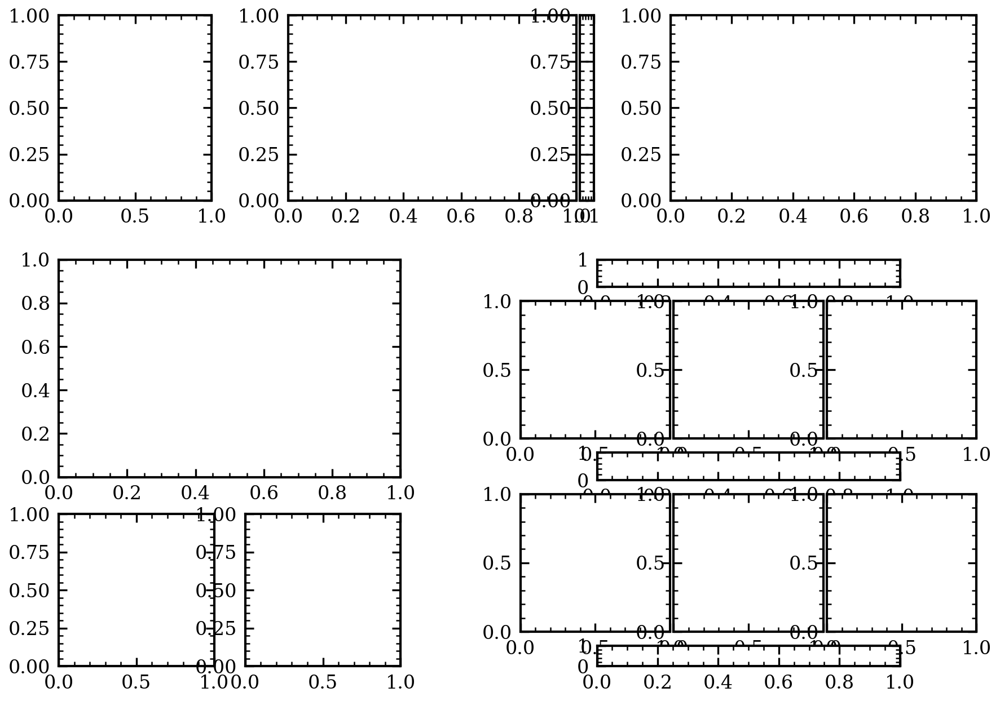

In [18]:

fig8 = plt.figure(figsize = (7,5), layout = "constrained")

gs_master = fig8.add_gridspec(2, 3, hspace = 0.2, height_ratios=[1, 2.2])

# One subgrid for each of the 6 panels (a-f)
wr = [1, 0.05]
gs_top = gridspec.GridSpecFromSubplotSpec(1, 3, subplot_spec=gs_master[0, :], width_ratios=[1, 2, 2], wspace = 0.3)
gs_bot = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs_master[1, :], width_ratios=[1.5, 2], wspace = 0.3)
gs_d = gridspec.GridSpecFromSubplotSpec(2, 2, subplot_spec=gs_bot[0, 0], height_ratios=[1, 0.7])
gs_e = gridspec.GridSpecFromSubplotSpec(5, 6, subplot_spec=gs_bot[0,1], height_ratios = [0.2, 1, 0.2, 1, 0.15],wspace=0.05)

gs_b = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs_top[0, 1], width_ratios=wr, wspace = 0.02)

ax_a = fig8.add_subplot(gs_top[0, 0])
ax_b = fig8.add_subplot(gs_b[0, 0])
ax_b_cax = fig8.add_subplot(gs_b[0,1]) 
ax_c = fig8.add_subplot(gs_top[0, 2])   
ax_d_band = fig8.add_subplot(gs_d[0, 0:2])
ax_d_lat = fig8.add_subplot(gs_d[1,0])
ax_d_bz  = fig8.add_subplot(gs_d[1,1])
ax_e_t1 = fig8.add_subplot(gs_e[0, 1:5])
ax_e1_bb = fig8.add_subplot(gs_e[1, 0:2])
ax_e1_bm = fig8.add_subplot(gs_e[1, 2:4])
ax_e1_bt = fig8.add_subplot(gs_e[1, 4:6])
ax_e_t2 = fig8.add_subplot(gs_e[2, 1:5])
ax_e2_bb = fig8.add_subplot(gs_e[3, 0:2])
ax_e2_bm = fig8.add_subplot(gs_e[3, 2:4])
ax_e2_bt = fig8.add_subplot(gs_e[3, 4:6])
ax_e_cax = fig8.add_subplot(gs_e[4,1:5])

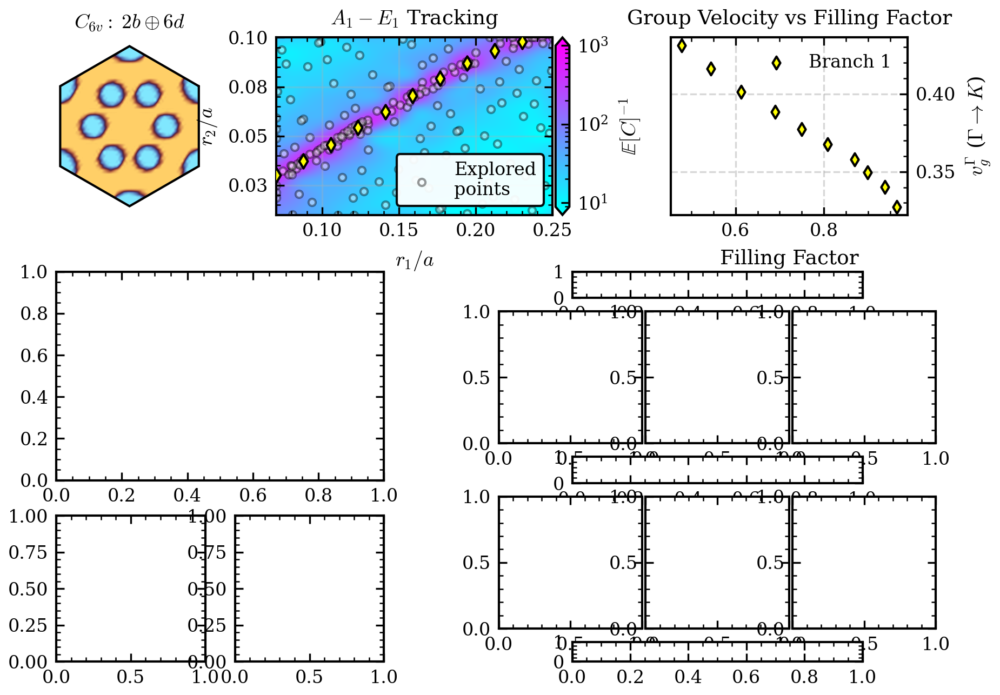

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patheffects as pe
from matplotlib.ticker import FormatStrFormatter, LogLocator, LogFormatterSciNotation
import joblib
import os
import matplotlib.gridspec as gridspec
import phc_nzi.simulation_viewer as sv

# --- PLOTTING ROW 1 ---

# Left PANEL: Crystal Structure
opt_3x3 = MPBDataOptions(rectify=True, periods=3, resolution=65)
eps_3x3 = simulation_2D_unoptimized.load_and_convert_epsilon_data(options=opt_3x3)
ax_a.clear()
ax_b.clear()
ax_c.clear()
plt.sca(ax_a) 
sv.plot_epsilon_on_ax(eps_3x3, lattice_type="hexagonal", interpolation="spline36", ws_lw = 1, padding=1.1)
plt.xticks([])
plt.yticks([])
plt.title(crystal_symmetries)
ax_a.set_aspect('equal')
ax_a.axis('off')

# Central Panel GP Surrogate Map
plt.sca(ax_b)
levels = np.logspace(np.log10(vmin), np.log10(vmax), 200)
heatmap = plt.contourf(R1, R2, Predicted_FOM_2D, levels=levels, cmap="cool", norm=log_norm, extend='both')
plt.scatter(X_train[:, 0], X_train[:, 1], c='white', edgecolors='black', s=10, alpha=0.4, label="Explored\npoints")

for entry in entries_branch_1:
    plt.scatter(entry['r1'], entry['r2_corrected'], marker="d", c="yellow", edgecolors='black', s=20, zorder=15)


ax_b.set_xlabel("$r_1/a$")
ax_b.set_ylabel("$r_2/a$")
ax_b.set_title(r"$A_1-E_1$ Tracking")
ax_b.grid(alpha=0.3)
ax_b.set_ylim(0.01, 0.1)
ax_b.set_xlim(0.07, 0.25)
ax_b.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax_b.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

cbar = fig8.colorbar(heatmap, cax=ax_b_cax, extend='both', fraction=0.046, pad=0.1, shrink=0.8, format=LogFormatterSciNotation())
cbar.set_label(r"$\mathbb{E}[C]^{-1}$")
cbar.locator = LogLocator(base=10.0, numticks=6)
cbar.update_ticks()
cbar.ax.yaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(2, 10), numticks=12))
ax_b.legend(loc='lower right', frameon=True, framealpha=0.95, edgecolor='black')

# Right panel: Group Velocity vs Filling Factor
plt.sca(ax_c)
ax_c.set_axisbelow(True)
plt.scatter(ffs_branch_1, vgs_branch_1, marker='d', color="yellow", edgecolors="black", label="Branch 1")
plt.legend()
plt.grid(linestyle='--', alpha=0.5)
plt.xlabel("Filling Factor")
plt.ylabel(r"$v_{g}^\Gamma$ ($\Gamma \to K$)")
plt.yscale("linear")
plt.title("Group Velocity vs Filling Factor")
ax_c.set_box_aspect(0.75)
plt.gca().yaxis.set_label_position("right")
plt.gca().yaxis.tick_right()
display(fig8)

22
4


Analytical Cartesian vg_x slopes: [ 6.20569698e-02 -6.20609998e-02  9.12563941e-06]


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
/zhome/2f/7/202918/miniconda3/envs/mpb-nzi-env/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


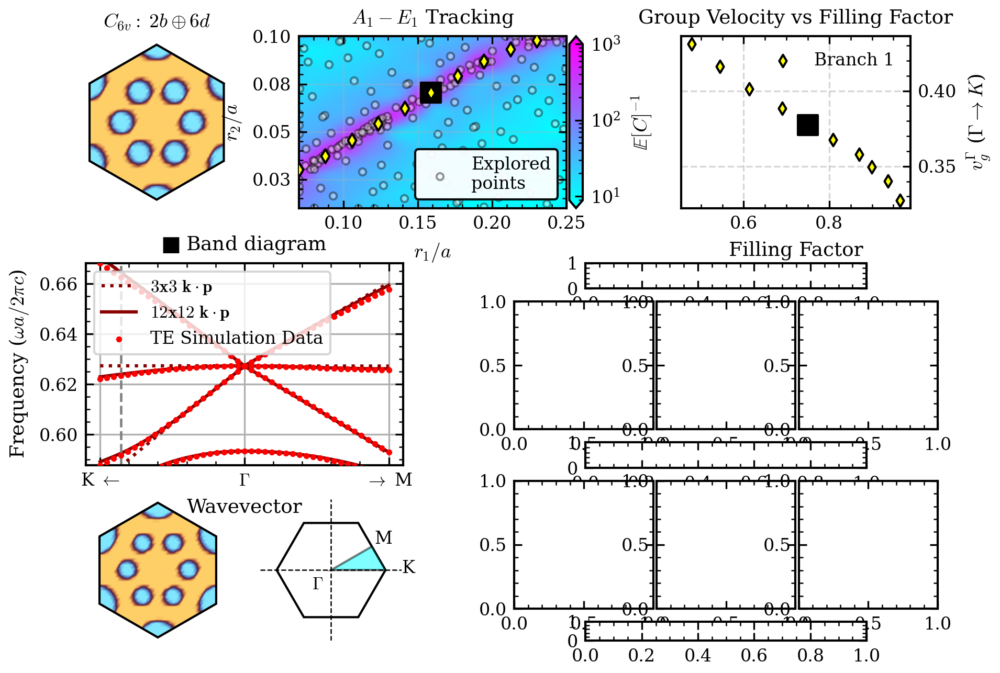

/zhome/2f/7/202918/miniconda3/envs/mpb-nzi-env/lib/python3.11/site-packages/IPython/core/events.py:96: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  func(*args, **kwargs)


In [20]:
import phc_nzi.pt_solver as pt_solver
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches

ax_d_band.clear()
ax_d_lat.clear()
ax_d_bz.clear()

# Find idx of the entry with the highest group velocity
i = 5
entry = entries_branch_1[i]
sim = entry["sim_corrected"]
df = sim.load_frequency_data(PARITY_2D)
irrpes = sim.identify_irrep_by_band_indices([1,2,3,4,5,6,7], PARITY_2D, POINT_GROUP)
gamma_idx_condition = (df["k1"] == 0) & (df["k2"] == 0)
gamma_idx = df.loc[gamma_idx_condition, "k index"].values[0]
idx_max = np.argmin(np.abs(df["kmag/2pi"]-0.1))
far_k_idx = int(df.iloc[idx_max]["k index"])
far_k_kmag2pi = df.iloc[idx_max]["kmag/2pi"]
r1 = entry["r1"]
r2 = entry["r2_corrected"]
data_line = rf"$r_1={r1:0.3f}a$, $r_2={r2:0.3f}a$, $FF={calculate_filling_factor(2,6,r1, r2):0.3f}$"

print(gamma_idx)
print(far_k_idx)

# --- Configuration ---
b_idxes = [2, 3, 4, 5, 6, 7, 8]
triplet_bands = entry["target_b_idxes"]
parity = PARITY_2D
lattice = "hexagonal"

# Map the physical band numbers to their index in the matrix
triplet_indices = [b_idxes.index(b) for b in triplet_bands]

# --- 1. Get Gamma State & Matrices ---
omega_0s = [df.loc[df["k index"] == gamma_idx, f"{parity} band {b}"].values[0] for b in b_idxes]

fields, eps_data = pt_solver.load_mpb_data(sim, gamma_idx, b_idxes, parity)
p_matrix, q_matrix = pt_solver.calculate_pt_matrices(fields, eps_data, parity, lattice)

# --- 2. Calculate Dispersion (Full & Reduced) ---
bands_full = pt_solver.calculate_perturbed_bands(
    p_matrix, q_matrix, omega_0s, 
    k1_arr=df["k1"].values, k2_arr=df["k2"].values, 
    kmag_arr=df["kmag/2pi"].values, lattice_type=lattice
)

bands_reduced = pt_solver.calculate_reduced_bands(
    p_matrix, omega_0s, 
    k1_arr=df["k1"].values, k2_arr=df["k2"].values, 
    kmag_arr=df["kmag/2pi"].values, 
    lattice_type=lattice, target_indices=triplet_indices
)

# --- 3. Cartesian Group Velocity ---
vg_x, vg_y = pt_solver.calculate_group_velocity_tensor(p_matrix, omega_0s, triplet_indices)
print(f"Analytical Cartesian vg_x slopes: {np.real(np.linalg.eigvals(vg_x))}")

import matplotlib.gridspec as gridspec
import matplotlib.patches as patches

# -- 0. Calculate Unified X-Axis for Path --
kx_mpb = df["k1"].values
ky_mpb = df["k2"].values

dkx = np.diff(kx_mpb); dky = np.diff(ky_mpb)
x_plot = np.concatenate(([0], np.cumsum(np.sqrt(dkx**2 + dky**2))))
x_plot -= x_plot[np.argmin(kx_mpb**2 + ky_mpb**2)]

target_x = x_plot[far_k_idx-1]

# Create a figure
# fig = plt.figure(figsize=(WIDTH_1*1.3, HEIGHT_1), constrained_layout=True, dpi=600)
# gs = gridspec.GridSpec(2, 3, figure=fig)

# ==========================================
# -- 1. LEFT PANEL: Band Diagram --
# ==========================================
plt.sca(ax_d_band)

# Plot REDUCED Linear Theory bands
plt.plot(x_plot, bands_reduced[:, 0], ':', color='darkred', linewidth=1.5, 
         label=r"$\mathbf{3x3 \ k \cdot p}$")
plt.plot(x_plot, bands_reduced[:, 1:], ':', color='darkred', linewidth=1.5)

# Plot FULL Perturbation Theory bands (Solid Dark Red)
plt.plot(x_plot, bands_full[:, 0], '-', color='darkred', linewidth=1.5, 
         label=r"$\mathbf{12x12 \ k \cdot p}$")
plt.plot(x_plot, bands_full[:, 1:], '-', color='darkred', linewidth=1.5)

# Plot ALL original MPB simulation data points
for i, b in enumerate(b_idxes):
    lbl = f"{PARITY_2D.upper()} Simulation Data" if i == 0 else None
    plt.scatter(x_plot, df[f"{parity} band {b}"], color='r', s=3, zorder=3, label=lbl)

ymin = np.min(df[f"{parity} band {np.min(entry['target_b_idxes'])}"].values)
ymax = np.max(df[f"{parity} band {np.max(entry['target_b_idxes'])}"].values)
plt.ylim(ymin, ymax)

plt.xlabel('Wavevector')
plt.ylabel(r'Frequency ($\omega a / 2\pi c$)')
plt.xticks([x_plot.min(), 0, x_plot.max()], ['K $\leftarrow$', r'$\Gamma$', r'$\rightarrow$ M'])
plt.grid(True)
plt.legend(frameon=True, fontsize=8, loc='best')

plt.title(r"$\blacksquare$ Band diagram")
plt.vlines(target_x, ymin, ymax, colors="gray", linestyles="--", label=None)

# ==========================================
# -- 2. TOP RIGHT: Square Lattice --
# ==========================================
opt = MPBDataOptions(rectify=True, periods=3, resolution = 65)
eps = sim.load_and_convert_epsilon_data(options=opt)
plt.sca(ax_d_lat)
sv.plot_epsilon_on_ax(eps, lattice_type="hexagonal", ws_lw = 1, interpolation = "spline36", padding =1.1)
plt.xticks([])
plt.yticks([])
plt.xlabel([])
plt.ylabel([])  
plt.gca().set_box_aspect(1)
plt.gca().axis('off')

# ==========================================
# -- 3. BOTTOM RIGHT: Brillouin Zone --
# ==========================================
plt.sca(ax_d_bz)
angles = np.linspace(0, 2*np.pi, 7)
plt.gca().add_patch(patches.Polygon([[np.cos(a), np.sin(a)] for a in angles], fill=False, edgecolor='black', linewidth=1))

m_x, m_y = np.cos(np.pi/6) * (np.sqrt(3)/2), np.sin(np.pi/6) * (np.sqrt(3)/2)
plt.gca().add_patch(patches.Polygon([[0, 0], [1, 0], [m_x, m_y]], closed=True, fill=True, facecolor='cyan', alpha=0.5, edgecolor='black'))

plt.axhline(0, color='black', linewidth=0.6, linestyle='--')
plt.axvline(0, color='black', linewidth=0.6, linestyle='--')

plt.text(-0.35, -0.35, r'$\Gamma$')
plt.text(1.3, -0.05, 'K')    
plt.text(m_x + 0.05, m_y + 0.05, 'M')

limit = 1.3
plt.xlim(-limit, limit); plt.ylim(-limit, limit)
plt.gca().set_box_aspect(1)

ax_bz = plt.gca()
for spine in ax_bz.spines.values(): spine.set_visible(False)
ax_bz.tick_params(which='both', bottom=False, top=False, left=False, right=False)
ax_bz.set_xticklabels([]); ax_bz.set_yticklabels([])
ax_bz.set_xlabel(r"$k_x$"); ax_bz.set_ylabel(r"$k_y$", rotation=0)
ax_bz.axis('off')


# Highlight the point with a star in ax_b and ax_c
ax_b.scatter(entry['r1'], entry['r2_corrected'], marker='s', color='black', s=80, zorder=10)
ax_c.scatter(entry['filling_factor'], np.linalg.norm(entry['group_velocity']), marker='s', color='black', s=80, zorder=10)


display(fig8)

In [21]:

# ==========================================
# 1. DATA LOADING
# ==========================================
conv_opt = MPBDataOptions(rectify=True, periods=3, transpose=False, resolution=65)

loaded_fields = {}
loaded_fields_far_k = {}
global_vmax = 0

try:
    eps_data = sim.load_and_convert_epsilon_data(options=conv_opt)
except Exception:
    eps_data = None

# Extract data at Gamma
for b_idx in entry["target_b_idxes"]:
    fz = sim.load_and_convert_field_data(
        gamma_idx, b_idx, "z", PARITY_2D, "e" if PARITY_2D == "tm" else "h", conversion_options=conv_opt, overwrite=True)
    
    
    loaded_fields[b_idx] = {'z': fz, 'x': None, 'y': None}
    
    local_max = np.max(np.abs(np.real(fz)))
    if local_max > global_vmax:
        global_vmax = local_max

# Identify the Irrep of these modes
irreps = sim.identify_irrep_by_band_indices(entry["target_b_idxes"], PARITY_2D, "C6v")

#Extract data for far k point
for b_idx in entry["target_b_idxes"]:
    fz = sim.load_and_convert_field_data(
        far_k_idx, b_idx, "z", PARITY_2D, "e" if PARITY_2D == "tm" else "h", conversion_options=conv_opt, overwrite=True)

    
    loaded_fields_far_k[b_idx] = {'z': fz, 'x': None, 'y': None}
    
    local_max = np.max(np.abs(np.real(fz)))
    if local_max > global_vmax:
        global_vmax = local_max



Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


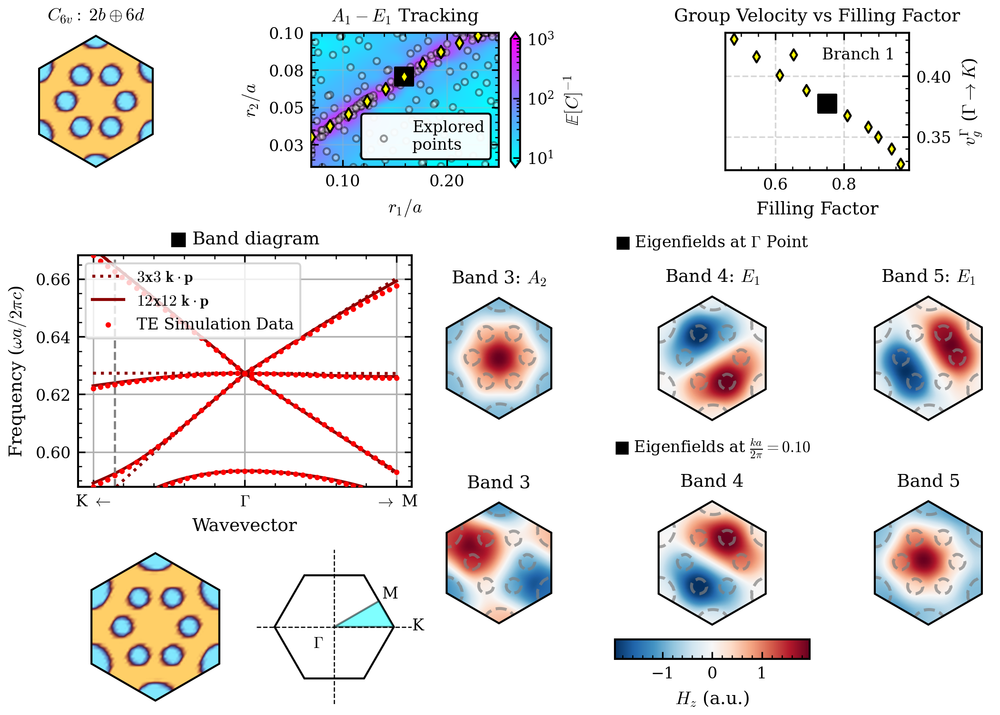

In [22]:
import phc_nzi.simulation_viewer as sv
# ---------------------------------------------------------
# PLOTTING LOGIC FOR PANEL (e)
# ---------------------------------------------------------
# Create 2 rows inside the subfigure
ax_e_t1.clear()
ax_e_t2.clear()
ax_e_t1.set_axis_off()
ax_e_t2.set_axis_off()
ax_e_t1.annotate(r"$\blacksquare$ " + r"Eigenfields at $\Gamma$ Point", 
                 xy=(0.5, 0.5), xycoords='axes fraction', 
                 ha='center', va='center')

ax_e_t2.annotate(r"$\blacksquare$ " + rf"Eigenfields at $\frac{{ka}}{{2\pi}} = {far_k_kmag2pi:0.2f}$", 
                 xy=(0.5, 0.5), xycoords='axes fraction', 
                 ha='center', va='center')


for ax in [ax_e1_bb, ax_e1_bm, ax_e1_bt, ax_e2_bb, ax_e2_bm, ax_e2_bt]:
    ax.clear()
    ax.set_axis_off()
# Plot bands at Gamma in the first 3 panels 
for ax, b_idx, irrep in zip([ax_e1_bb, ax_e1_bm, ax_e1_bt], entry["target_b_idxes"], irreps):
    data = loaded_fields[b_idx]
    im = sv.plot_field_quiver_on_ax(        
        field_z=data['z'],
        field_x=data['x'],
        field_y=data['y'],
        eps_data=eps_data,
        ax = ax, 
        lattice_type="hexagonal",
        step = 5,
        ws_lw = 1,
        padding = 1.1
    )
    ax.set_title(f"Band {b_idx}: ${irrep}$")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_box_aspect(1)
    ax.axis('off')


# Plot bands at far k point in the last 3 panels
for ax, b_idx in zip([ax_e2_bb, ax_e2_bm, ax_e2_bt], entry["target_b_idxes"]):
    data = loaded_fields_far_k[b_idx]
    im = sv.plot_field_quiver_on_ax(        
        field_z=data['z'],
        field_x=data['x'],
        field_y=data['y'],
        eps_data=eps_data,
        ax = ax, 
        lattice_type="hexagonal",
        step = 5,
        ws_lw = 1,
        padding=1.1
    )
    ax.set_title(rf"Band {b_idx}")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_box_aspect(1)
    ax.axis('off')

cbar = fig8.colorbar(im, cax=ax_e_cax, orientation='horizontal', fraction = 0.3)
cbar.ax.set_box_aspect(0.1)
cbar.set_label(r"$H_{z}$ (a.u.)", fontsize=9)
display(fig8)


In [23]:
fig8.savefig(os.path.join(figure_path, "figure_hBN.pdf"), 
             bbox_inches='tight')

## Slab



### Unoptimized

In [24]:
RESOLUTION_SLAB = mp.Vector3(25, 25, 10)

In [25]:
SIMULATE = False
r1 = entry["r1"]
r2 = entry["r2_corrected"]
hh = 0.5

hh=0.2
r1=0.21887076173103942
r2=0.08469532708791312

## Define the simulation
configuration_options_slab_unoptimized = dict(
    resolution = RESOLUTION_SLAB,
    num_bands=14,
    k_points=k_points["k_points_values"],
    k_points_interpolation_factor = 10,
    extra_runner_command = "(output-at-kpoint (vector3 0 0 0) fix-hfield-phase output-hfield display-symmetries-c6v)",
)

mpb_configuration_slab_unoptimized=MPBSchemeConfigurator(
    photonic_crystal_slab, ["zeven"], **configuration_options_slab_unoptimized)

# Run or load the unoptimized 2D simulation to get the data for plotting


# make a new simulation just for this purpose, to avoid overwriting the original one with the new parameters
name_slab_unoptimized = name + "_slab_unoptimized"
simulation_slab_unoptimized = Simulation(
    simulation_name = name_slab_unoptimized,
    script = mpb_configuration_slab_unoptimized.get_scheme_config(join_newline=True),
    directory= os.path.join(data_rooth, name_slab_unoptimized)
    )
if SIMULATE is True:
    print("Slab simulation started")
    simulation_slab_unoptimized.run_hpc(mpb_command_line_params=dict(r1 = r1, r2 = r2, x_dist = x_dist, h = hh), mpi = False, version = "mpb-dev/1.11.2-dev")
    print("Done.")
print("Collecting results forom ", simulation_slab_unoptimized.directory)


COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']


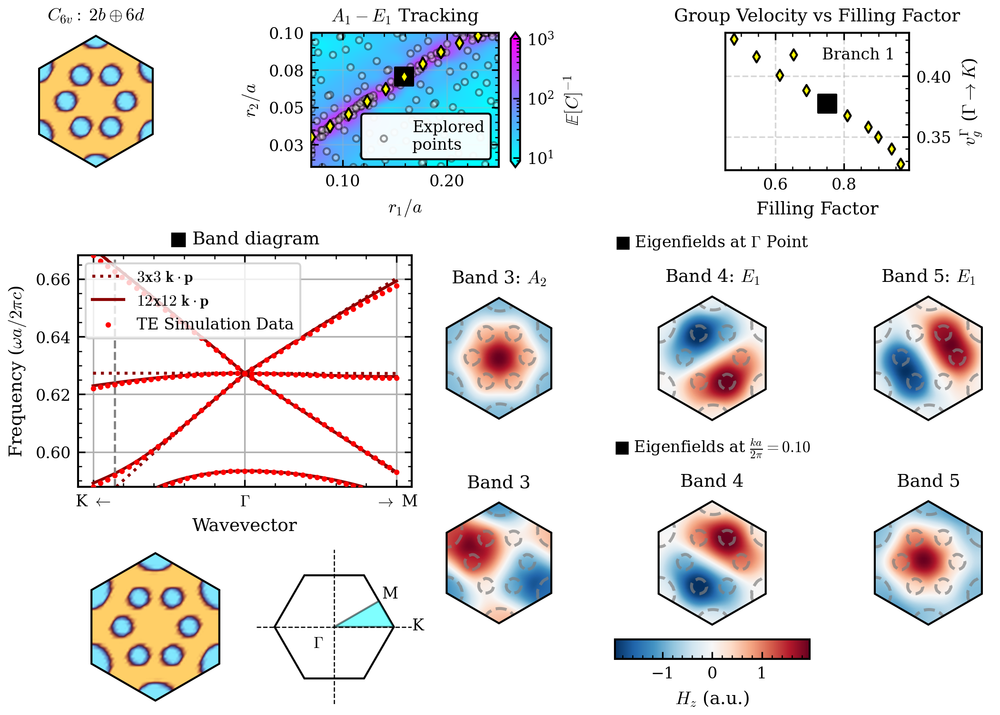

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.


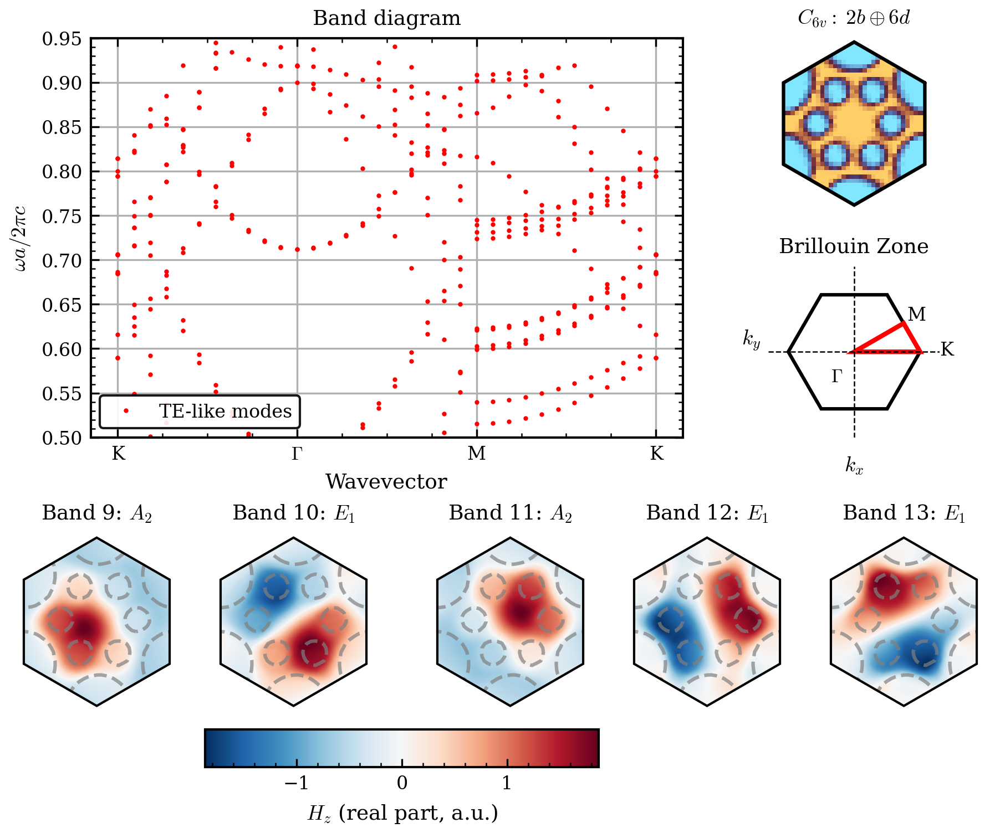

In [26]:
# Plot the band diagram and the unit cell
PARITY_SLAB = "zeven"
df = simulation_slab_unoptimized.load_frequency_data(PARITY_SLAB)
df_target_idx = df.loc[(df["k1"] == 0) & (np.abs(df["k2"]) == 0), "k1"].idxmin()
k_idx_for_field_plot = df.loc[df_target_idx, "k index"]
plot_options = dict(linestyle='', marker='o', markersize=1)

# Create a figure with a custom grid layout
fig = plt.figure(figsize=(6, 5),constrained_layout=True)
gs = gridspec.GridSpec(2, 1, figure=fig, height_ratios=[3,2])
gs_top = gridspec.GridSpecFromSubplotSpec(2,3, subplot_spec=gs[0, :], wspace=0.1)
gs_bottom = gridspec.GridSpecFromSubplotSpec(2,5, subplot_spec=gs[1, :], wspace=0.1, height_ratios = [1,0.2])


axes_fields = []
for i in range(5):
    ax_field = fig.add_subplot(gs_bottom[0, i])
    axes_fields.append(ax_field)
cax = fig.add_subplot(gs_bottom[1,1:3])

# -- 1. LEFT PANEL: Band Diagram --
ax_band = fig.add_subplot(gs_top[:, 0:2])
plt.sca(ax_band) # Set current axis for the viewer
plot_options = dict(linestyle='', marker='o', markersize=1)

viewer_2D = sv.SimulationViewer(simulation_slab_unoptimized)
# viewer_2D.plot_band_diagram("tm", k_points_path=k_points, color="blue", plot_options=plot_options)
viewer_2D.plot_band_diagram(PARITY_SLAB, k_points_path=k_points, color="red", plot_options=plot_options, custom_label="TE-like modes")
ax_band.set_ylabel(r"$\omega a/2\pi c$")
ax_band.set_title("Band diagram")
plt.ylim(0.5,0.95)
ymin, ymax = ax_band.get_ylim()
# ax_band.vlines(k_idx_for_field_plot, ymin, ymax, colors="gray", linestyles="--", label=None)


# -- 2. TOP RIGHT PANEL: Crystal Structure½
ax_lat = fig.add_subplot(gs_top[0, 2])
plt.sca(ax_lat)
opt_3x3 = MPBDataOptions(rectify=True, periods=(3,3,1), resolution=35)

eps_3x3 = simulation_slab_unoptimized.load_and_convert_epsilon_data(options=opt_3x3)
eps_data = eps_3x3[:,:,eps_3x3.shape[2]//2] 
sv.plot_epsilon_on_ax(eps_data, lattice_type="hexagonal", ws_lw = 1.5, padding = 1.1)
plt.xticks([])
plt.yticks([])
plt.title(crystal_symmetries)
plt.xlabel([])
plt.ylabel([])  
ax_lat.set_box_aspect(1)
ax_lat.axis('off')


# --3. BOTTOM LEFT PANEL: Brillouin Zone with IBZ highlighted
ax_bz = fig.add_subplot(gs_top[1, 2])
# Define Hexagon vertices (Pointy-topped to match your K-vector on x-axis)
angles = np.linspace(0, 2*np.pi, 7)
hexagon_vertices = [[np.cos(a), np.sin(a)] for a in angles]
bz_hexagon = patches.Polygon(hexagon_vertices, fill=False, edgecolor='black', linewidth=1.5)
ax_bz.add_patch(bz_hexagon)

# Define Irreducible Brillouin Zone (IBZ) triangle: Gamma -> K -> M
m_x, m_y = np.cos(np.pi/6) * (np.sqrt(3)/2), np.sin(np.pi/6) * (np.sqrt(3)/2)
ibz_vertices = [[0, 0], [1, 0], [m_x, m_y]]
ibz_triangle = patches.Polygon(ibz_vertices, closed=True, fill=False, alpha=1, edgecolor='red', linewidth=2)
ax_bz.add_patch(ibz_triangle)

# Add crosshair lines through the origin
ax_bz.axhline(0, color='black', linewidth=0.6, linestyle='--')
ax_bz.axvline(0, color='black', linewidth=0.6, linestyle='--')

# Add High-Symmetry point labels
ax_bz.text(-0.35, -0.45, r'$\Gamma$',)
ax_bz.text(1.3, -0.05, 'K',)    
ax_bz.text(m_x + 0.05, m_y + 0.05, 'M', )

# Format axes
limit = 1.3
ax_bz.set_xlim(-limit, limit)
ax_bz.set_ylim(-limit, limit)
ax_bz.set_box_aspect(1)
for spine in ax_bz.spines.values():
    spine.set_visible(False)
ax_bz.tick_params(which='both', bottom=False, top=False, left=False, right=False)
ax_bz.set_xticklabels([])
ax_bz.set_yticklabels([])
ax_bz.grid(False) 
ax_bz.set_xlabel(r"$k_x$")
ax_bz.set_ylabel(r"$k_y$", rotation=0)
ax_bz.set_title("Brillouin Zone")

eps = simulation_slab_unoptimized.load_and_convert_epsilon_data(options=MPBDataOptions(rectify=False))
calculate_filling_factor_from_distribution(eps, (1 + no_hBN**2)/2)



# --4. Field Plots

# Plot the eigen fields 
for ax in axes_fields: 
    ax.set_axis_off()
band_indices = [ 9, 10, 11, 12, 13]


# data loading
conv_opt = MPBDataOptions(rectify=True, periods=3, transpose=False, resolution=65)
loaded_fields = {}
global_vmax = 0

for b_idx in band_indices:
    fz = simulation_slab_unoptimized.load_and_convert_field_data(
        k_idx_for_field_plot, b_idx, "z", PARITY_SLAB, "h" if PARITY_SLAB == "zeven" else "e", conversion_options=opt_3x3, overwrite=True)
    
    fz = fz[:,:,fz.shape[2]//2]
    loaded_fields[b_idx] = {'z': fz, 'x': None, 'y': None}
    
    local_max = np.max(np.abs(np.real(fz)))
    if local_max > global_vmax:
        global_vmax = local_max

# Identify the Irrep of these modes
irreps = simulation_slab_unoptimized.identify_irrep_by_band_indices(band_indices, PARITY_SLAB, POINT_GROUP)

# Plot fields 
for ax, b_idx, irrep in zip(axes_fields, band_indices, irreps):
    data = loaded_fields[b_idx]
    im = sv.plot_field_quiver_on_ax(        
        field_z=data['z'],
        field_x=data['x'],
        field_y=data['y'],
        eps_data=eps_data,
        ax = ax, 
        lattice_type="hexagonal",
        step = 5,
        ws_lw = 1,
        padding = 1.1,
    )
    ax.set_title(f"Band {b_idx}: ${irrep}$")
    ax.set_box_aspect(1)



cbar = fig.colorbar(im, cax=cax, orientation='horizontal') 
cbar.set_label(r"$H_{z}$ (real part, a.u.)")
plt.show()

In [27]:
# Print irreps for each band
irreps = simulation_slab_unoptimized.identify_irrep_by_band_indices(range(1,14), PARITY_SLAB, POINT_GROUP)
for b_idx, irrep in zip(range(1,14), irreps):
    freq = df.loc[df["k index"] == k_idx_for_field_plot, f"{PARITY_SLAB} band {b_idx}"].values[0]
    print(f"Band {b_idx}: Irrep = {irrep}", f"Frequency = {freq:0.4f}")

Band 1: Irrep = A_2 Frequency = 0.0000
Band 2: Irrep = E_1 Frequency = 0.2337
Band 3: Irrep = E_1 Frequency = 0.2337
Band 4: Irrep = E_1 Frequency = 0.4708
Band 5: Irrep = E_1 Frequency = 0.4708
Band 6: Irrep = E_1 Frequency = 0.7117
Band 7: Irrep = E_1 Frequency = 0.7117
Band 8: Irrep = B_1 Frequency = 0.8996
Band 9: Irrep = A_2 Frequency = 0.9184
Band 10: Irrep = E_1 Frequency = 0.9188
Band 11: Irrep = A_2 Frequency = 0.9190
Band 12: Irrep = E_1 Frequency = 0.9684
Band 13: Irrep = E_1 Frequency = 0.9685


### Optimization

In [28]:
def run_simulation_task_slab(entry, which_sim = "sim", which_param_1 = "r1", which_param_2 = "r2", which_param_3 = "h",  mpi = False, version = "mpb-dev/1.11.2-dev"):
    return entry[which_sim].run_hpc(
        mpb_command_line_params=dict(r1=entry[which_param_1], r2=entry[which_param_2], x_dist = 0.25, h=entry[which_param_3]), 
        mpi=mpi, 
        version=version
    )


# Gamma-only configuration (for optimization)
config_gamma_degeneracy_slab = dict(
    resolution=RESOLUTION_SLAB,
    num_bands=14,
    k_points=[mp.Vector3(0, 0, 0)],
    extra_runner_command = "display-symmetries-c6v",
)
mpb_config_gamma_degeneracy_slab= MPBSchemeConfigurator(photonic_crystal_slab, [PARITY_SLAB], **config_gamma_degeneracy_slab)
script_gamma_degeneracy_slab = mpb_config_gamma_degeneracy_slab.get_scheme_config(join_newline=True)


def run_sweeper_and_analyze(entry, n_r2_sweep, b_idx_top, b_idx_bot):
    
    try:
        data_old = entry["sim"].load_frequency_data(PARITY_SLAB)
        # Calculate gaps at Gamma (k=0)
        # Note: Ensuring we only look at k=0 if your sweep contains multiple k-points
        gamma_data = data_old[(data_old['k1'] == 0) & (data_old['k2'] == 0)]
        gap = (gamma_data[f'{PARITY_SLAB} band {b_idx_top}'] - gamma_data[f'{PARITY_SLAB} band {b_idx_bot}']).abs().values[0]
        entry["gap"] = gap
        sw = entry['sweeper']
        
        # Load or Run
        if SIMULATE:
            sw.run() 
            
        # Data Extraction
        data = sw.data if len(sw.data) > 0 else sw.load_df()
        data = sw.data if len(sw.data) > 0 else sw.load_df()

        gaps = (data[f'band_{b_idx_top}'] - data[f'band_{b_idx_bot}']).abs().values

        best = int(np.argmin(gaps))
        r2_corr = entry['r2_sweep'][best]

        # Update entry with results
        entry['gap_corrected'] = gaps[best]
        entry['r2_corrected'] = r2_corr
        entry['delta_r2'] = r2_corr - entry['r2']
        entry['edge_warning'] = (best == 0 or best == n_r2_sweep - 1)

        
        return None, None
    except Exception as e:
        return None, f"Error at r1={entry['r1']}: {str(e)}"


# Configurations for linearity analysis
configuration_options_slab_vg = dict(
    resolution = RESOLUTION_SLAB,
    num_bands=14,
    k_points=[mp.Vector3(0.001, 0, 0)],  # Small k-point near Gamma for group velocity extraction
    extra_runner_command = "fix-hfield-phase output-hfield display-symmetries-c6v display-group-velocities",
)
mpb_configuration_slab_vg =MPBSchemeConfigurator(
    photonic_crystal_slab, [PARITY_SLAB], **configuration_options_slab_vg)

script_slab_vg = mpb_configuration_slab_vg.get_scheme_config(join_newline=True)



COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']


In [29]:
import phc_nzi.mpi_bayesian_optimization as mpi_bo
import phc_nzi.simulation_handler as sim_handler
from importlib import reload


# Reload the module
reload(mpi_bo)
reload(sim_handler)

# Extract the newly reloaded class
MPIBayesianOptimizator = mpi_bo.MPIBayesianOptimizator
Simulation = sim_handler.Simulation

In [30]:
simulation_slab_test = Simulation(
    simulation_name = name + "_test",
    script = script_gamma_degeneracy_slab,
    directory= os.path.join(data_rooth, name + "_test")
)
simulation_slab_test.run_hpc(mpb_command_line_params=dict(r1=0.2215840599093047, r2=0.09336611349485796, x_dist = 0.25, h=0.4), mpi=False, version="mpb-dev/1.11.2-dev")
data_test = simulation_slab_test.load_frequency_data(PARITY_SLAB)
irreps_test = simulation_slab_test.identify_irrep_by_band_indices_with_confidence(range(1,15), PARITY_SLAB, "C6v")
for b_idx, (irrep, confidence) in zip(range(1,15), irreps_test):
    freq = data_test.loc[data_test['k index'] == 1, f'{PARITY_SLAB} band {b_idx}'].values[0]
    print(b_idx, ": ", irrep, confidence, freq)

mpi_bo.find_bands_from_irreps(
    simulation=simulation_slab_test, 
    target_irreps=['A_2', 'E_1', "E_1"], 
    parity=PARITY_SLAB, 
    symmetry_group=POINT_GROUP,
    irrep_occurrences=[1, 4, 4],
    degeneracy_tol = 3e-3,
    irrep_log_file = None
)
    


1 :  A_2 1.0000000000003886 0
2 :  E_1 0.9999975872209175 0.225358
3 :  E_1 0.9999703742721309 0.22541
4 :  E_1 0.9999942428664466 0.462059
5 :  E_1 0.9999129967277547 0.462154
6 :  E_1 0.999984603352448 0.706121
7 :  E_1 0.9998053351321069 0.706264
8 :  B_1 0.995652366382779 0.814278
9 :  E_1 0.6741843755992539 0.851525
10 :  E_1 0.8013250097841566 0.851982
11 :  E_1 0.519746468064086 0.852
12 :  E_1 0.9998157976381999 0.957068
13 :  E_1 0.9996316381567723 0.957191
14 :  E_2 0.9958528719603097 0.988757
Degeneracy correction applied at bands [9, 10, 11] with freqs [0.851525 0.851982 0.852   ] and irreps ['E_1', 'E_1', 'E_1'] relabeled to ['A_2', 'E_1', 'E_1']



([9, 10, 11],
 {2: ('E_1', 0.9999975872209175, 0.225358),
  3: ('E_1', 0.9999703742721309, 0.22541),
  4: ('E_1', 0.9999942428664466, 0.462059),
  5: ('E_1', 0.9999129967277547, 0.462154),
  6: ('E_1', 0.999984603352448, 0.706121),
  7: ('E_1', 0.9998053351321069, 0.706264),
  8: ('B_1', 0.995652366382779, 0.814278),
  9: ('A_2', 0.6741843755992539, 0.851525),
  10: ('E_1', 0.8013250097841566, 0.851982),
  11: ('E_1', 0.519746468064086, 0.852),
  12: ('E_1', 0.9998157976381999, 0.957068),
  13: ('E_1', 0.9996316381567723, 0.957191),
  14: ('E_2', 0.9958528719603097, 0.988757)},
 None)

In [33]:
from concurrent.futures import ThreadPoolExecutor
from tqdm.auto import tqdm
import os


SIMULATE = False
folder_name = name + "_slab_optimization"

h_array = [0.1, 0.15, 0.2, 0.3, 0.4]
N_INIT = 3
N_BO = 3
OBJECTIVE_MODE = "log" # log or linear
USE_LSF = False
NUMPROC = 30
def run_optimizer(h):

    lsf_config = LSFJobConfiguration(num_processors=NUMPROC, span_option="ptile", span_value=7, queue="hpc",   mem = "1GB")
    # NOTE: Higher kappa values in LCB acquisition function encourage exploration, which can be beneficial in early optimization stages or when the objective landscape is complex. 
    # Adjust based on observed convergence behavior.

    bo_options = {
        "dimensions": [(0.15, 0.25), (0.05, 0.1)],
        "acq_func": "LCB",
        "acq_func_kwargs": {"kappa": 3.5},
        "n_initial_points": NUMPROC * N_INIT,
        "initial_point_generator": "sobol",
        "random_state": 42,
    }

    id = f"BO_A2_E1_h_{h:.2f}"
    optimizer_A2_E1_slab = MPIBayesianOptimizator(
        simulation_name=id,
        scheme_script=script_gamma_degeneracy_slab,
        directory=os.path.join(data_rooth, folder_name, id),
        maxiter=N_INIT+N_BO, 
        batch_size=NUMPROC,
        param_names=["r1", "r2"],
        polarization=PARITY_SLAB,
        symmetry_group=POINT_GROUP,
        target_irreps=["A_2", "E_1", "E_1"], 
        irrep_occurrences=[1, 4, 4],
        bo_options=bo_options,
        fixed_params = {"x_dist": 0.25},
        objective_mode = OBJECTIVE_MODE,
        target_cost =0.0025,
        strategy = "cl_min",
        height_slab=h,
        degeneracy_tol = 5e-3,
        use_mpi = USE_LSF, 
        local_workers = NUMPROC,
    )
    if SIMULATE is True:
        optimizer_A2_E1_slab.erease_data_file()
        if USE_LSF:
            optimizer_A2_E1_slab.submit_lsf_job(lsf_config, conda_env_name="mpb-nzi-env")
        else: 
            optimizer_A2_E1_slab.optimize_parameters()
    return {"optimizer": optimizer_A2_E1_slab, "h": h}


with ThreadPoolExecutor() as executor:
    slab_optimization_results = list(tqdm(executor.map(run_optimizer, h_array), total=len(h_array), desc="Submitting Jobs"))

Submitting Jobs:   0%|          | 0/5 [00:00<?, ?it/s]

Processing results for h=0.10...


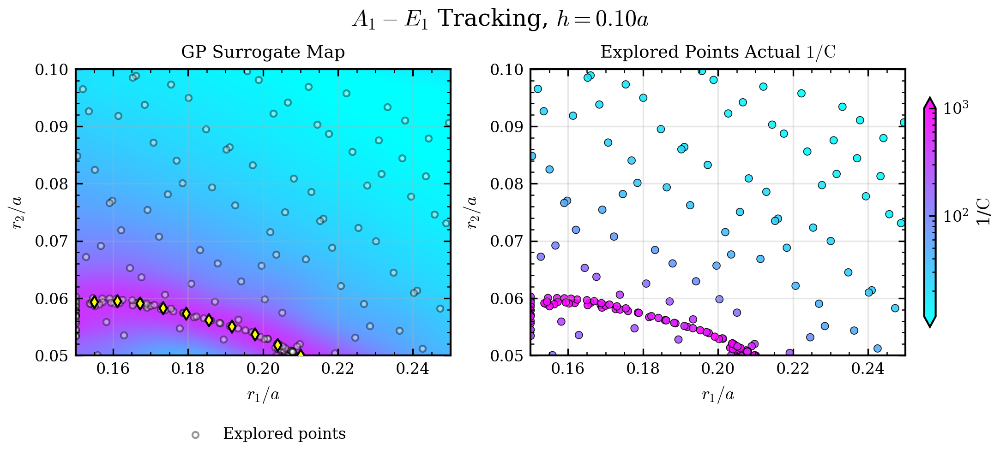

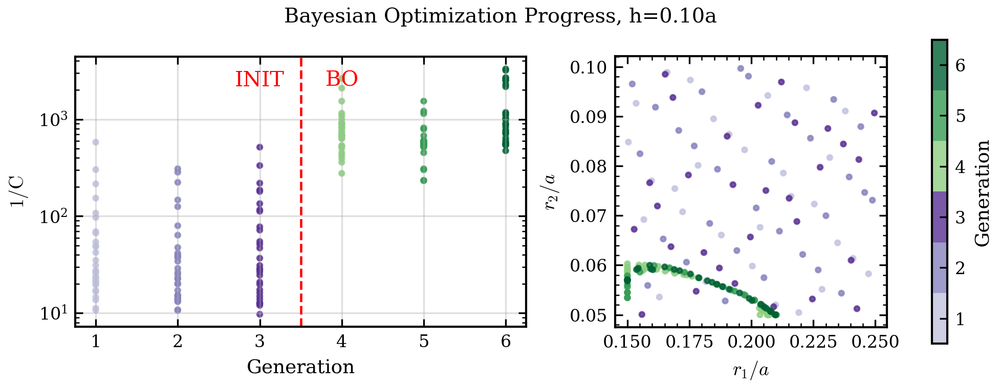

Processing results for h=0.15...


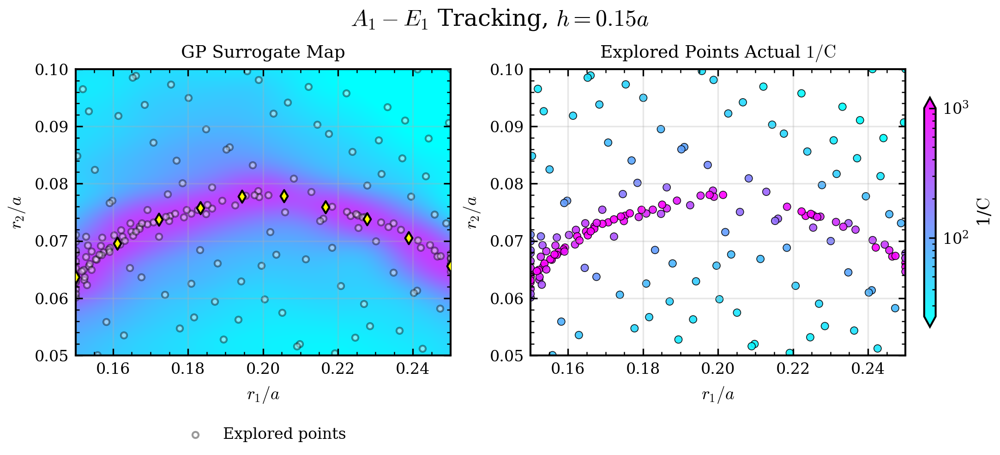

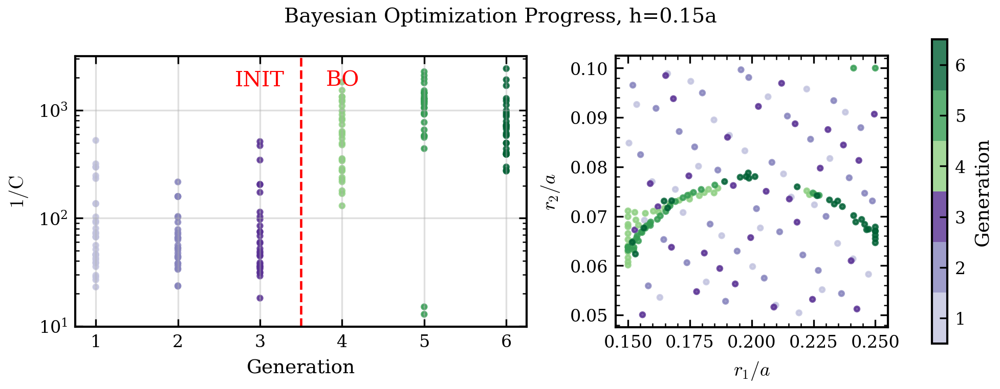

Processing results for h=0.20...


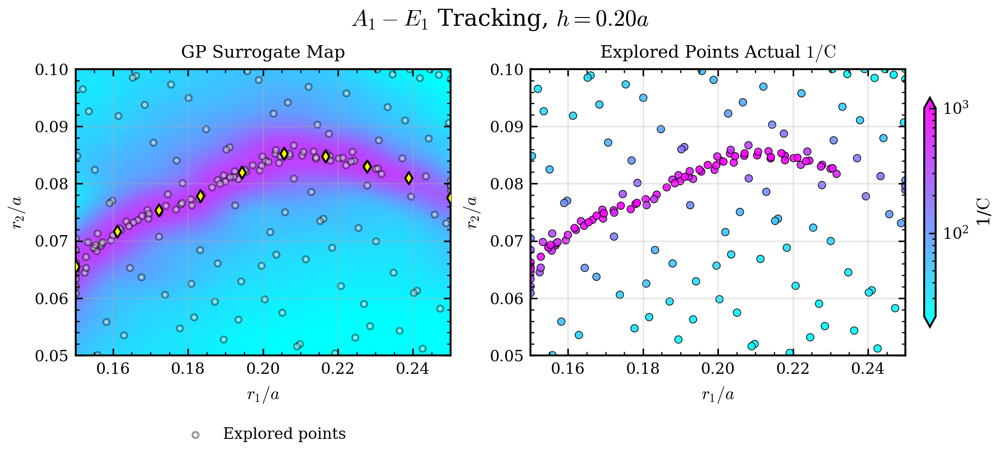

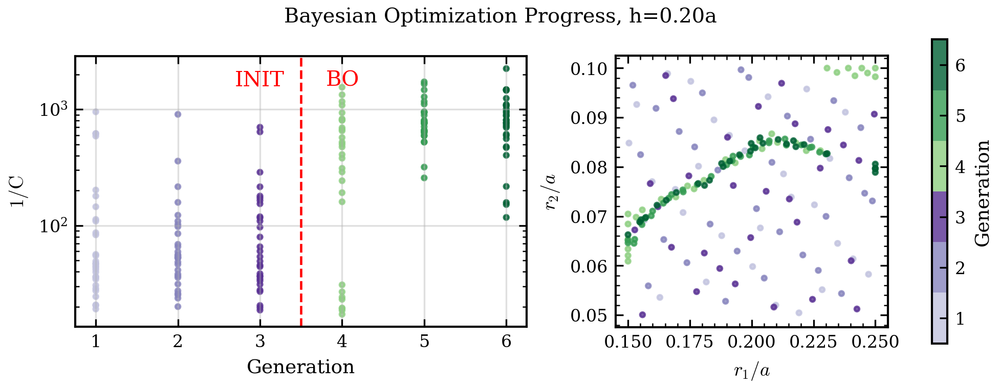

Processing results for h=0.30...


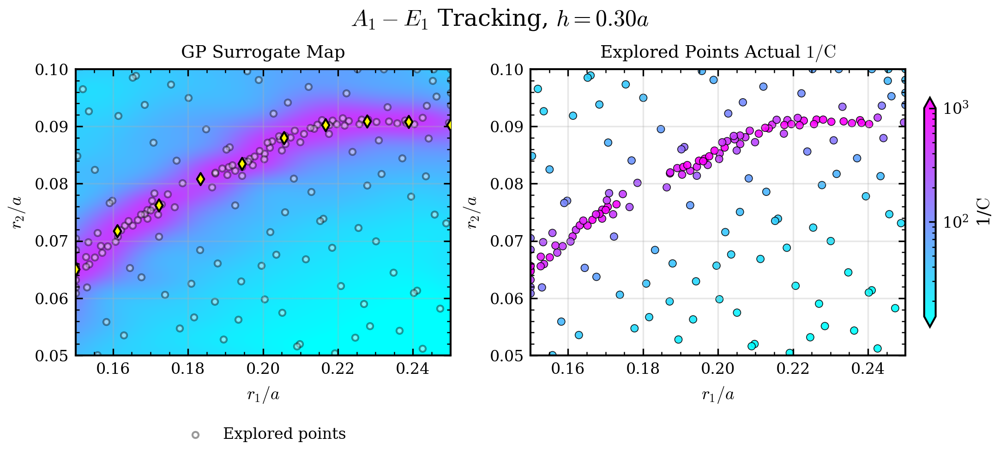

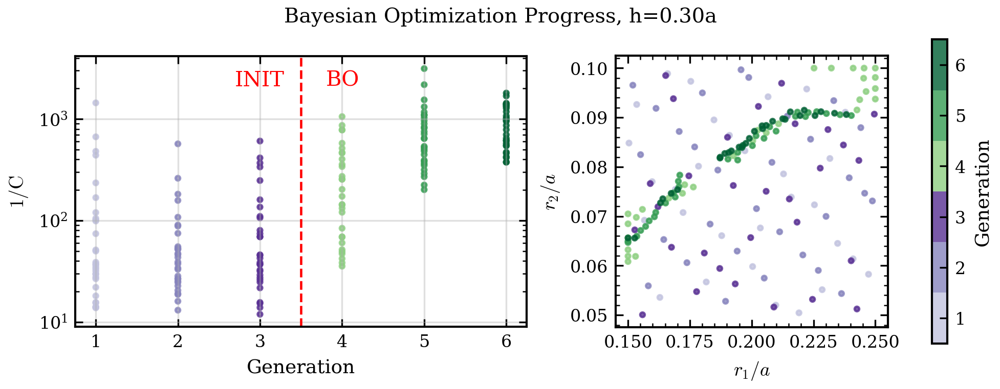

Processing results for h=0.40...


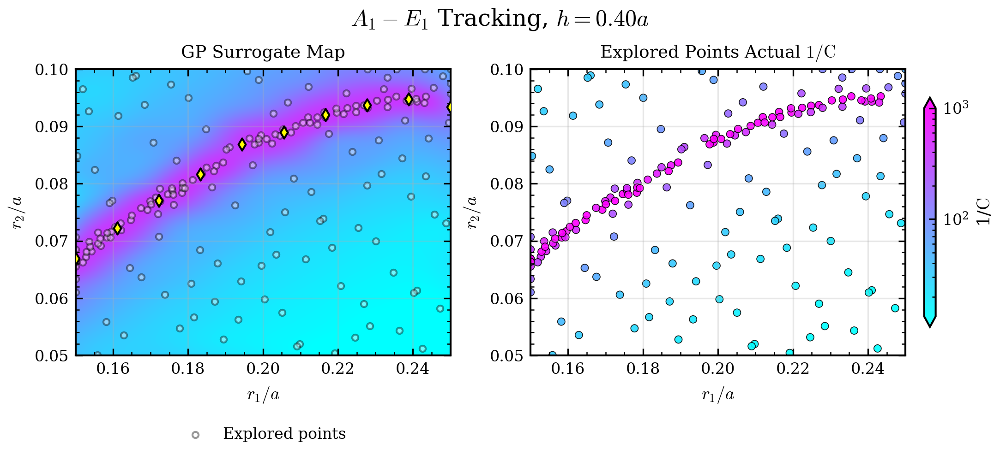

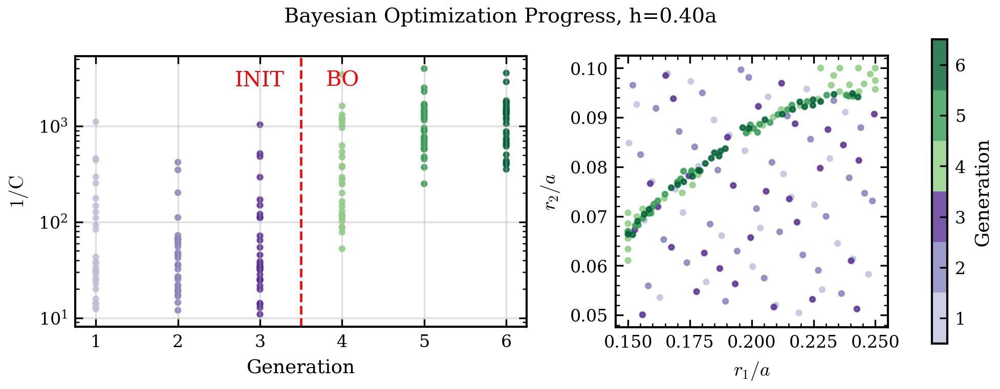

In [35]:
for res in slab_optimization_results:
        
    opt = res["optimizer"]
    h = res["h"]
    print(f"Processing results for h={h:.2f}...")
    # =================================================================
    # CONFIGURATION SWITCH: Set to "log" or "linear" depending on the run
    # =================================================================
   


    # 1. Load Data and Optimizer
    analyzer = OptimizationDataAnalyzer(opt.data_file)
    try: 
        analyzer.load_data()
    except Exception as e:
        print(f"Error loading data : {e}")
        continue

    loaded_optimizer = joblib.load(opt.model_file)

    # Prepare predictions from the GP
    gp_model = loaded_optimizer.models[-1]
    valid = (analyzer.cost_vals > 0) & (~np.isnan(analyzer.cost_vals))
    X_train = np.c_[analyzer.param1_vals[valid], analyzer.param2_vals[valid]]
    fom_train = 1.0 / analyzer.cost_vals[valid]  # Calculate 1/C for explored points

    # Setup grids for the map
    r1_grid = np.linspace(0.15, 0.25, 200)
    r2_grid = np.linspace(0.05, 0.1, 200)
    R1, R2 = np.meshgrid(r1_grid, r2_grid)
    grid_points = np.c_[R1.ravel(), R2.ravel()]

    grid_points_transformed = loaded_optimizer.space.transform(grid_points)
    gp_predictions = gp_model.predict(grid_points_transformed)

    # --- DYNAMIC SCALE CONVERSION ---
    if OBJECTIVE_MODE == "log":
        predicted_cost = 10**gp_predictions
    else:
        predicted_cost = gp_predictions

    # Calculate the Figure of Merit cleanly on a linear scale
    predicted_cost_safe = np.clip(predicted_cost, a_min=1e-6, a_max=None)
    Predicted_FOM_2D = (1.0 / predicted_cost_safe).reshape(R1.shape)

    # --- FIND 10 OPTIMAL SAMPLES FOR 0.05 < r1 < 0.14 ---
    r1_bounds = (0.155, 0.21) if h == 0.1 else (0.15, 0.25)
    r1_samples_1 = np.linspace(r1_bounds[0], r1_bounds[1], 10)
    optimal_r2_points_1 = []
    r2_search = np.linspace(0.05, 0.1, 500)

    for r1_val in r1_samples_1:
        test_points = np.c_[np.full(len(r2_search), r1_val), r2_search]
        test_transformed = loaded_optimizer.space.transform(test_points)
        
        # np.argmin works identically for both linear cost and log10(cost)
        # because log10 is a strictly monotonic function!
        costs_pred = gp_model.predict(test_transformed)
        best_r2 = r2_search[np.argmin(costs_pred)]
        optimal_r2_points_1.append([r1_val, best_r2])

    branch_1 = np.array(optimal_r2_points_1)

    # VMIN AND VMAX FROM PERCENTILES
    vmin, vmax = np.percentile(Predicted_FOM_2D, [5, 99])
    vmax = 1e3
    log_norm = mcolors.LogNorm(vmin=vmin, vmax=vmax)

    # ---------------------------------------------------------
    # Initialize Figure with 2 Subplots (Spatial 2D layouts)
    # ---------------------------------------------------------
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7.2, 3.2), layout="constrained")
    fig.suptitle(rf"$A_1-E_1$ Tracking, $h={h:.2f}a$", fontsize=12)

    # --- LEFT PLOT: GP Surrogate Map ---
    levels = np.logspace(np.log10(vmin), np.log10(vmax), 200)
    heatmap = ax1.contourf(R1, R2, Predicted_FOM_2D, levels=levels, cmap="cool", norm=log_norm, extend='both')

    # Plot Sampled Points (Training data placeholder dots)
    ax1.scatter(X_train[:, 0], X_train[:, 1], c='white', edgecolors='black', 
            s=10, alpha=0.4, label="Explored points")

    # Plot the Optimal Samples extracted from the GP
    ax1.scatter(branch_1[:, 0], branch_1[:, 1], 
            color='yellow', marker='d', s=20, edgecolors='black', 
            label=None, zorder=15)

    ax1.set_xlabel("$r_1/a$")
    ax1.set_ylabel("$r_2/a$")
    ax1.set_title("GP Surrogate Map")
    ax1.grid(alpha=0.3)
    ax1.set_xlim(0.15, 0.25)
    ax1.set_ylim(0.05, 0.1)

    ax1.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax1.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax1.legend(loc='lower center', bbox_to_anchor=(0.5, -0.35), ncol=1, framealpha=0.95, edgecolor='black')


    # --- RIGHT PLOT: 2D Scatter of Explored Points (Same Map Space) ---
    # X_train[:, 0] is r1, X_train[:, 1] is r2. Colored by fom_train (1/C)
    scatter2 = ax2.scatter(X_train[:, 0], X_train[:, 1], c=fom_train, 
                        cmap="cool", norm=log_norm, edgecolors='black', 
                        linewidths=0.4, s=15, alpha=0.9)

    ax2.set_xlabel("$r_1/a$")
    ax2.set_ylabel("$r_2/a$")
    ax2.set_title("Explored Points Actual $1/\mathrm{C}$")
    ax2.grid(alpha=0.3)
    ax2.set_xlim(0.15, 0.25)
    ax2.set_ylim(0.05, 0.1)  # Matches the y-limits of the meshgrid/left plot

    # Formatting ticks for right plot
    ax2.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax2.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))


    # --- COLORBAR SETUP (Attached to ax2 on the far right) ---
    cbar = fig.colorbar(scatter2, ax=ax2, extend='both', fraction=0.046, pad=0.05, shrink=0.8, format=LogFormatterSciNotation())
    cbar.set_label(r"1/$\mathrm{C}$")
    cbar.locator = LogLocator(base=10.0, numticks=6)
    cbar.update_ticks()
    cbar.ax.yaxis.set_minor_locator(LogLocator(base=10.0, subs=np.arange(2, 10), numticks=12))

    plt.show()

    import os
    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.colors as mcolors
    from matplotlib.ticker import MultipleLocator, NullLocator

    # Load data
    analyzer.load_data()  
    df = analyzer.get_points_above_treshold(0)

    # Count generations from 1 instead of 0
    if df["Gen"].min() == 0:
        df["Gen"] = df["Gen"] + 1

    s = 5

    # Determine strictly integer min and max generations
    min_gen = int(df["Gen"].min())
    max_gen = int(df["Gen"].max())

    num_lhs = int(N_INIT - min_gen + 1)
    num_bo = int(max_gen - N_INIT)


    colors_lhs = plt.get_cmap("Purples")(np.linspace(0.35, 0.85, num_lhs))
    colors_bo = plt.get_cmap("YlGn")(np.linspace(0.45, 0.9, num_bo))
    combined_colors = np.vstack([colors_lhs, colors_bo])
    cmap = mcolors.ListedColormap(combined_colors)
    boundaries = np.arange(min_gen - 0.5, max_gen + 1.5, 1)
    norm = mcolors.BoundaryNorm(boundaries, ncolors=len(combined_colors))

    # Set the width ratio to 1.66 : 1 to compensate for the 0.6 : 1.0 box aspect ratios.
    fig, (ax1, ax2, cax) = plt.subplots(
        1, 3, 
        figsize=(6.5, 2.5), 
        layout="constrained",
        gridspec_kw={'width_ratios': [1.66, 1, 0.2]}
    )
    fig.suptitle(rf"Bayesian Optimization Progress, h={h:0.2f}a")

    # --- LEFT PLOT ---
    ax1.scatter(df["Gen"], 1/(df["cost"]), c=df["Gen"], cmap=cmap, norm=norm, s=s, alpha=0.8)

    ax1.set_xlabel("Generation")
    ax1.set_ylabel(r"$1/\mathrm{C}$")
    ax1.set_yscale('log')
    ax1.grid(alpha=0.4)

    ax1.xaxis.set_major_locator(MultipleLocator(1))
    ax1.xaxis.set_minor_locator(NullLocator())

    ax1.axvline(N_INIT+0.5, color='red', linestyle='--')
    ax1.text(N_INIT+0.3, 0.95, "INIT", ha='right', va='top', fontsize=10, 
            color='red', transform=ax1.get_xaxis_transform())
    ax1.text(N_INIT+0.8, 0.95, "BO", ha='left', va='top', fontsize=10, 
            color='red', transform=ax1.get_xaxis_transform())

    ax1.set_box_aspect(0.6)

    # --- RIGHT PLOT ---
    scatter = ax2.scatter(df["r1"], df["r2"], c=df["Gen"], cmap=cmap, norm=norm, s=s, alpha=0.8)
    ax2.set_box_aspect(1)

    # Attach colorbar to the figure, specifying it belongs to ax2
    cbar = fig.colorbar(scatter, cax=cax, label="Generation", shrink=0.6)
    cbar.set_ticks(np.arange(min_gen, max_gen + 1))
    cbar.ax.yaxis.set_minor_locator(NullLocator())

    ax2.set_xlabel("$r_1/a$")
    ax2.set_ylabel("$r_2/a$")

    cax.set_box_aspect(20)

    res["branch"]=branch_1

    plt.show()

### Group Velocity analysis

In [41]:
SIMULATE = False

In [42]:
for res in slab_optimization_results:
    import os
    from concurrent.futures import ThreadPoolExecutor, as_completed
    from tqdm.auto import tqdm

    # --- 1. Prevent HDF5 locking collisions ---
    os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"
    folder_name = name + "_slab_optimized"
    # Initialize the entries
    # For these entries the band gap is almost closed but is better to fine tune the parameters
    entries_branch_1 = []
    for pt in res["branch"]:
        r1, r2 = pt
        id = "r1_{r1:.3f}_r2_{r2:.3f}_h_{h:.3f}".format(r1=r1, r2=r2, h=res['h'])
        sim = Simulation(
            simulation_name=id,
            script=script_gamma_degeneracy_slab,
            directory=os.path.join(data_rooth, folder_name, f"{res['h']:0.3f}",  "initial_samples", id)
        )
        entries_branch_1.append({
            "r1": r1,
            "r2": r2,
            "h": res['h'],
            "sim": sim
        })


    # Execute concurrently
    if SIMULATE is True:
        # Set worker count (adjust based on your machine's capabilities)
        N_WORKERS = 30
        
        with ThreadPoolExecutor(max_workers=N_WORKERS) as executor:
            # Create a dictionary mapping futures to entries
            futures = {executor.submit(run_simulation_task_slab, entry): entry for entry in entries_branch_1}
            
            # Wrap the completion generator with tqdm for the progress bar
            for future in tqdm(as_completed(futures), total=len(futures), desc="Running Simulations"):
                entry = futures[future]
                try:
                    future.result() 
                except Exception as e:
                    # Use tqdm.write to avoid breaking the progress bar visually
                    tqdm.write(f"Simulation failed for r1={entry['r1']}, r2={entry['r2']}, h={entry['h']}: {e}")


    # Display the irreps for the target bands so that we can make sure to close the gap 
    # between the correct bands in the next optimization iteration
    for entry in entries_branch_1:
        sim = entry["sim"]
        b_list = [7,8,9,10,11]
        irreps = sim.identify_irrep_by_band_indices(b_list, PARITY_SLAB, POINT_GROUP)
        entry["irreps"] = {}
        for b, irrep in zip(b_list, irreps):
            entry["irreps"][b] = irrep

        # find consecutive (A_2, E_1, E_1) bands in any order
        # starting from the upper band (11) and going downwards
        entry["target_b_idxes"] = []
        for b_idx in range(11, 7, -1):
            if entry["irreps"][b_idx] in ["A_2", "E_1"]:
                entry["target_b_idxes"].append(b_idx)
            if len(entry["target_b_idxes"]) == 3:
                break
        
        print(f"r1={entry['r1']:.3f}, r2={entry['r2']:.3f}, h={entry['h']:.3f} -> Irreps: {irreps}-> Target bands: {entry['target_b_idxes']} with irreps {[entry['irreps'][b] for b in entry['target_b_idxes']]}") 

    res["entries"]= entries_branch_1


r1=0.155, r2=0.059, h=0.100 -> Irreps: ['E_1', 'B_1', 'E_1', 'E_1', 'A_2']-> Target bands: [11, 10, 9] with irreps ['A_2', 'E_1', 'E_1']
r1=0.161, r2=0.060, h=0.100 -> Irreps: ['E_1', 'B_1', 'E_1', 'A_2', 'E_1']-> Target bands: [11, 10, 9] with irreps ['E_1', 'A_2', 'E_1']
r1=0.167, r2=0.059, h=0.100 -> Irreps: ['E_1', 'B_1', 'E_1', 'A_2', 'E_1']-> Target bands: [11, 10, 9] with irreps ['E_1', 'A_2', 'E_1']
r1=0.173, r2=0.058, h=0.100 -> Irreps: ['E_1', 'B_1', 'E_1', 'A_2', 'E_1']-> Target bands: [11, 10, 9] with irreps ['E_1', 'A_2', 'E_1']
r1=0.179, r2=0.057, h=0.100 -> Irreps: ['E_1', 'B_1', 'E_1', 'A_2', 'E_1']-> Target bands: [11, 10, 9] with irreps ['E_1', 'A_2', 'E_1']
r1=0.186, r2=0.056, h=0.100 -> Irreps: ['E_1', 'B_1', 'E_1', 'A_2', 'E_1']-> Target bands: [11, 10, 9] with irreps ['E_1', 'A_2', 'E_1']
r1=0.192, r2=0.055, h=0.100 -> Irreps: ['E_1', 'B_1', 'E_1', 'A_2', 'E_1']-> Target bands: [11, 10, 9] with irreps ['E_1', 'A_2', 'E_1']
r1=0.198, r2=0.054, h=0.100 -> Irreps: ['

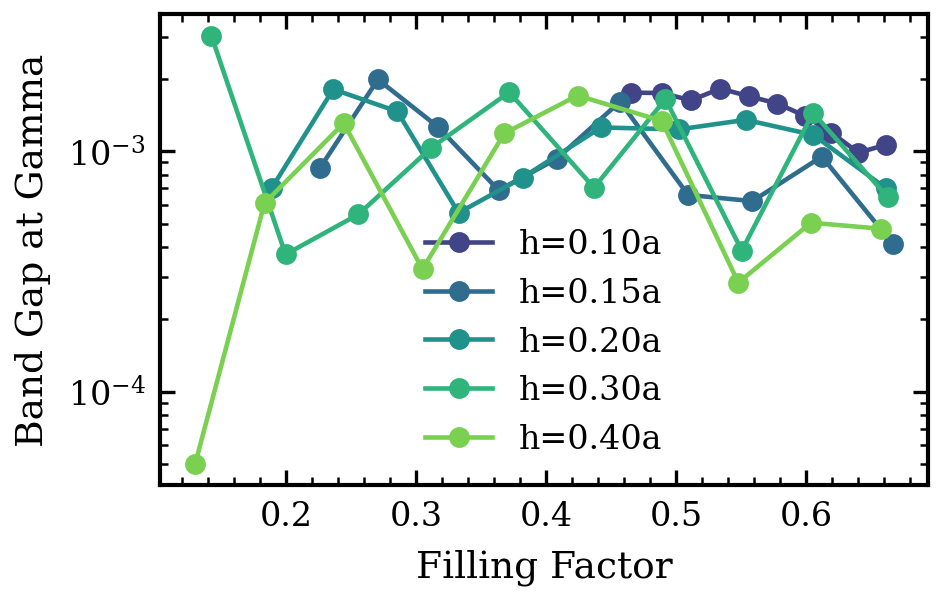

In [44]:
plt.figure()
colors = plt.get_cmap("viridis")(np.linspace(0.2, 0.8, len(slab_optimization_results)))
for i, res in enumerate(slab_optimization_results):
    for entry in res["entries"]:
        b_idx_top = np.max(entry["target_b_idxes"])
        b_idx_bot = np.min(entry["target_b_idxes"])
        data_old = entry["sim"].load_frequency_data(PARITY_SLAB)
        # Calculate gaps at Gamma (k=0)
        # Note: Ensuring we only look at k=0 if your sweep contains multiple k-points
        gamma_data = data_old[(data_old['k1'] == 0) & (data_old['k2'] == 0)]
        gap = (gamma_data[f'{PARITY_SLAB} band {b_idx_top}'] - gamma_data[f'{PARITY_SLAB} band {b_idx_bot}']).abs().values[0]
        entry["gap"] = gap

    gaps = [entry["gap"] for entry in res["entries"]]
    ffs = [calculate_filling_factor(3,6, entry["r1"], entry["r2"]) for entry in res["entries"]]

    plt.plot(ffs, gaps, marker='o',  zorder=10, label=f"h={res['h']:.2f}a", color=colors[i])
plt.xlabel("Filling Factor")
plt.ylabel("Band Gap at Gamma")
plt.gca().set_yscale('log')
plt.legend()
plt.show()

In [46]:
SIMULATE = True

In [47]:
for res in slab_optimization_results:

    # --- 1. Prevent HDF5 locking collisions ---
    os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"
    # Initialize the entries
    # For these entries the band gap is almost closed but is better to fine tune the parameters
    for entry in res["entries"]:
        r1, r2 = entry["r1"], entry["r2"]
        h = entry["h"]
        id = "r1_{r1:.3f}_r2_{r2:.3f}_h_{h:.3f}".format(r1=r1, r2=r2, h=h)
        sim_vg = Simulation(
            simulation_name=id,
            script=script_slab_vg,
            directory=os.path.join(data_rooth, folder_name, f"{res['h']:0.3f}", f"vg", id)
        )
        entry["sim_vg"] = sim_vg
        

    # Execute concurrently
    if SIMULATE is True:
        # Set worker count (adjust based on your machine's capabilities)
        N_WORKERS = 30
        
        with ThreadPoolExecutor(max_workers=N_WORKERS) as executor:
            # Create a dictionary mapping futures to entries
            futures = {executor.submit(run_simulation_task_slab, entry, "sim_vg"): entry for entry in res["entries"]}
            
            # Wrap the completion generator with tqdm for the progress bar
            for future in tqdm(as_completed(futures), total=len(futures), desc="Running Simulations"):
                entry = futures[future]
                try:
                    future.result() 
                except Exception as e:
                    # Use tqdm.write to avoid breaking the progress bar visually
                    tqdm.write(f"Simulation failed for r1={entry['r1']}, r2={entry['r2']}, h={entry['h']}: {e}")


    # Display the irreps for the target bands so that we can make sure to close the gap 
    # between the correct bands in the next optimization iteration

    vgs = []
    ffs = []
    for entry in res["entries"]:
        try:
            r1 = entry["r1"]
            r2 = entry["r2"]
            # Compute the filling fraction where eps>1.2 vs total area of eps
            filling_fraction = calculate_filling_factor(2, 6, r1, r2)
            vg = extract_group_velocity(entry["sim_vg"],PARITY_SLAB,k_idx=1, b_idx=np.max(entry["target_b_idxes"]))
            entry["group_velocity"] = vg
            vgs.append(np.sqrt(vg[0]**2 + vg[1]**2 + vg[2]**2))
            entry["filling_factor"] = filling_fraction
            ffs.append(filling_fraction)
        except:
            print(f"Failed to extract data for r1={r1}, r2={r2}")
    
    res["vgs"] = vgs
    res["ffs"] = ffs


Running Simulations:   0%|          | 0/10 [00:00<?, ?it/s]

Running Simulations:   0%|          | 0/10 [00:00<?, ?it/s]

Running Simulations:   0%|          | 0/10 [00:00<?, ?it/s]

Running Simulations:   0%|          | 0/10 [00:00<?, ?it/s]

Running Simulations:   0%|          | 0/10 [00:00<?, ?it/s]

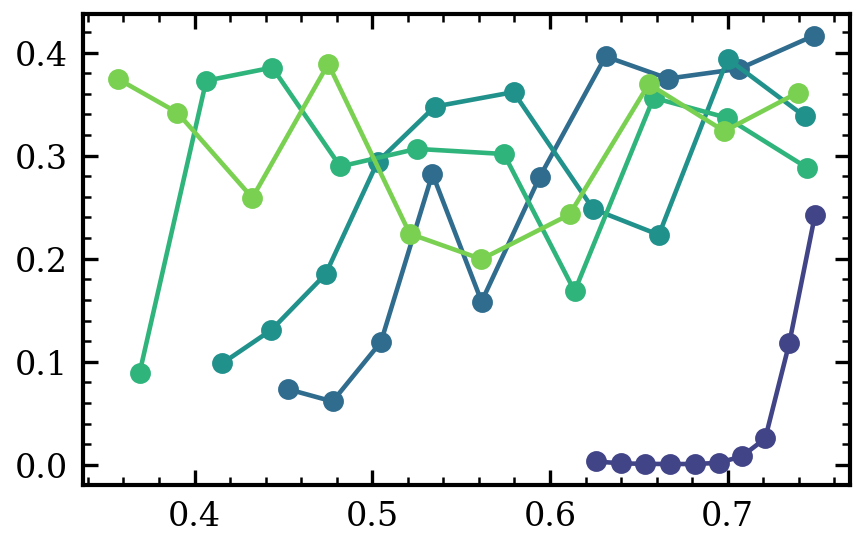

In [48]:
for i, res in enumerate(slab_optimization_results):
    plt.plot(res["ffs"], res["vgs"] , marker='o',  zorder=10, label=f"h={res['h']:.2f}a", color=colors[i])

In [54]:
SIMULATE = False

In [60]:
# reload Simulation class to clear any cached data
from importlib import reload
import phc_nzi.simulation_handler as sim_handler
reload(sim_handler)
Simulation = sim_handler.Simulation

/zhome/2f/7/202918/phc_nzi/src/phc_nzi/simulation_handler.py:505: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  


Processing h=0.1:   0%|          | 0/10 [00:00<?, ?it/s]

COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)'

Processing h=0.15:   0%|          | 0/10 [00:00<?, ?it/s]

COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)'

Processing h=0.2:   0%|          | 0/10 [00:00<?, ?it/s]

COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)'

Processing h=0.3:   0%|          | 0/10 [00:00<?, ?it/s]

COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)'

Processing h=0.4:   0%|          | 0/10 [00:00<?, ?it/s]

COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']
Vector3<0.00909091, 0.0, 0.0>
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)'

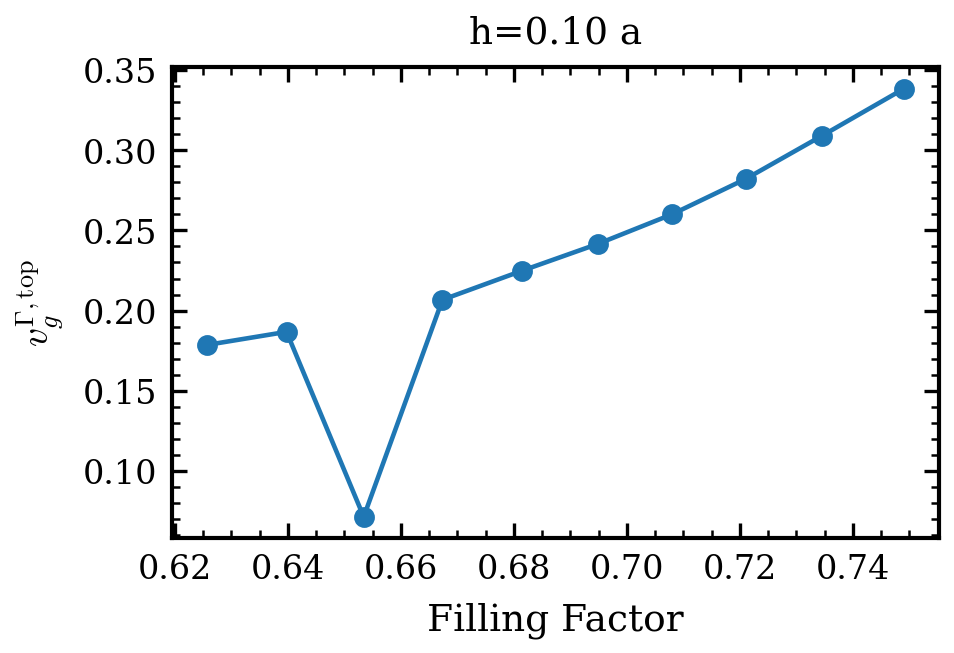

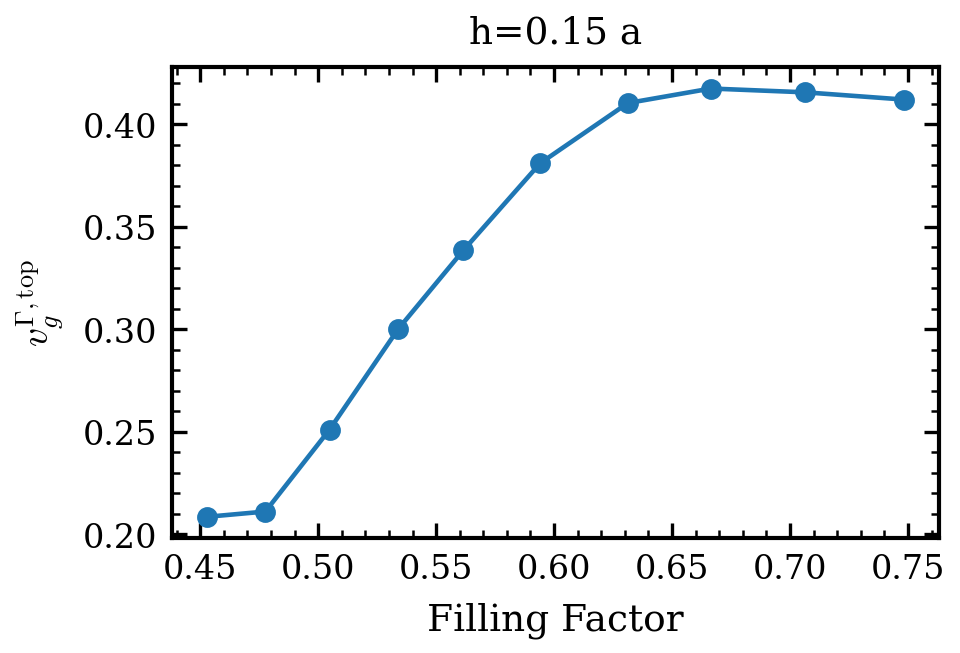

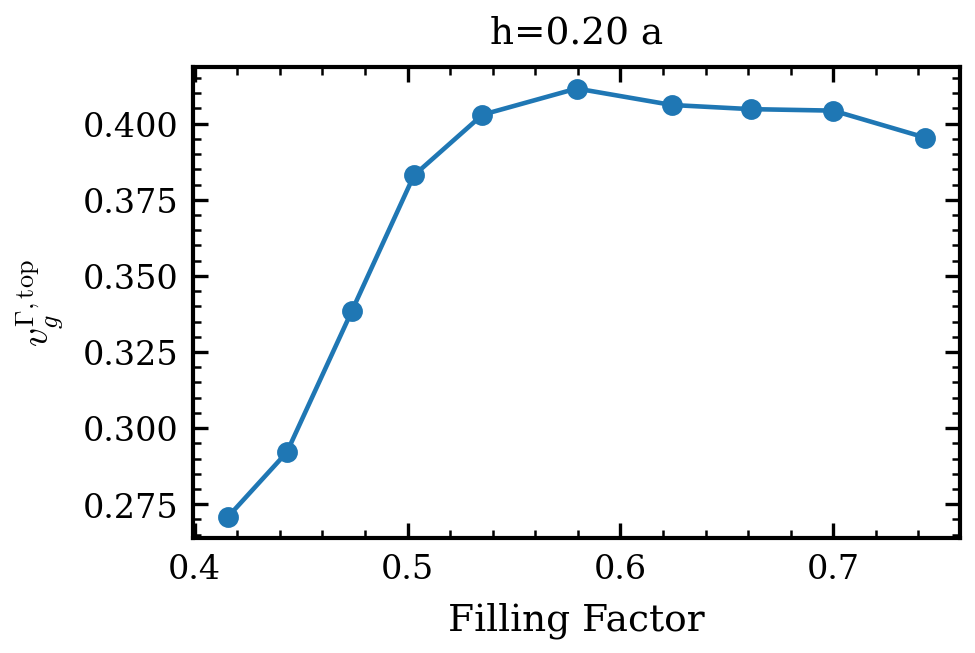

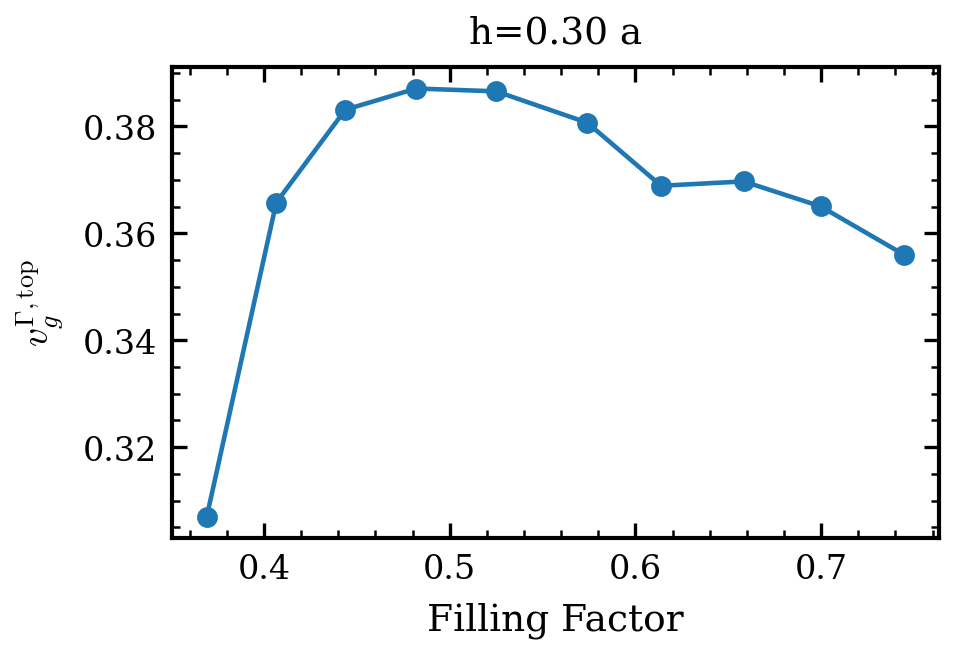

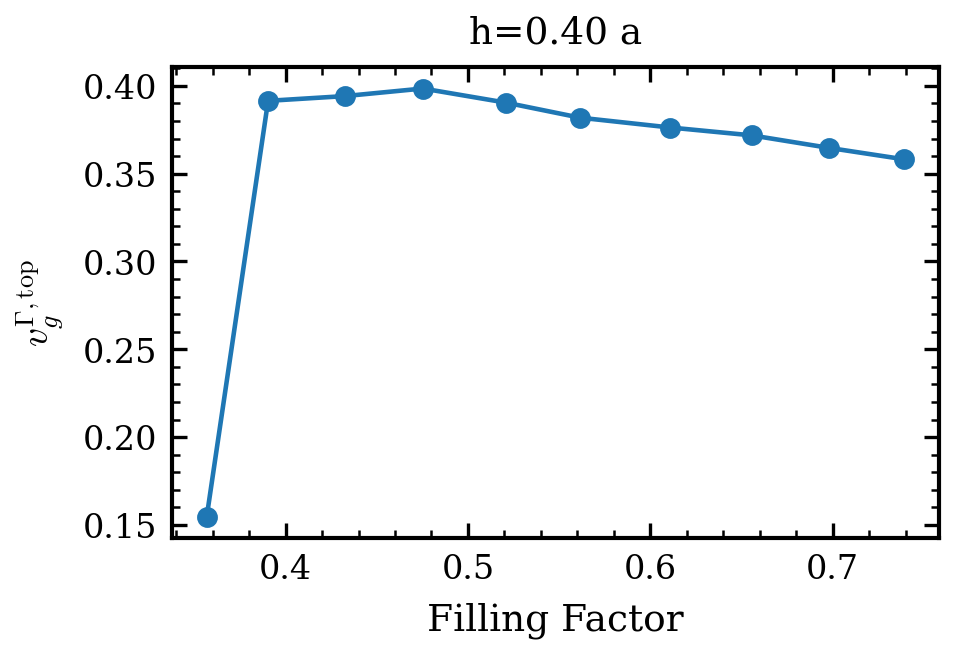

In [114]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm.auto import tqdm  # Add this import
SIMULATE = False
PLOT = False
configuration_options_slab_optimized = dict(
    resolution=RESOLUTION_SLAB,
    num_bands=12,
    k_points=k_points_2D_optimized["k_points_values"],
    k_points_interpolation_factor=10,
    # extra_runner_command = "fix-hfield-phase output-hfield display-symmetries-c6v",
)
            
plot_options = {
    "color" : "r", 
    "linestyle" : "",
    "marker" : ".",
}
mpb_configuration_slab_optimized = MPBSchemeConfigurator(
    photonic_crystal_slab, ["zeven"], **configuration_options_slab_optimized)

# Plot the band diagram for all the samples in h=0.10
for res in slab_optimization_results:
    if res['h'] in  [0.1,0.15,0.2,0.3, 0.4]:
        # Wrap the inner loop with tqdm
        for entry in tqdm(res["entries"], desc=f"Processing h={res['h']}"):
            id = "r1_{r1:.3f}_r2_{r2:.3f}_h_{h:.3f}".format(r1=entry["r1"], r2=entry["r2"], h=entry["h"])
            sim = Simulation(
                simulation_name=entry["sim"].simulation_name,
                script=mpb_configuration_slab_optimized.get_scheme_config(join_newline=True),
                directory=os.path.join(data_rooth, folder_name, f"{res['h']:0.3f}", f"band_structure", id )
            )
            
            if SIMULATE == True: 
                sim.run_hpc(mpb_command_line_params=dict(r1=entry['r1'], r2=entry['r2'], x_dist=0.25, h=entry['h']), mpi=True, version="mpb-dev/1.11.2-dev", 
                            cores = int(5))
            try:
                df = sim.load_frequency_data("zeven")
            except:
                print(f"Failed to load data for r1={entry['r1']}, r2={entry['r2']}, h={entry['h']}")
                continue
            gamma_k_idx_in_df = df[(df["k1"] == 0) & (df["k2"] == 0)].index[0]
            # ymin and ymax are taken from the max and min of the target bands 
            b_idx_top = np.max(entry["target_b_idxes"])
            b_idx_bot = np.min(entry["target_b_idxes"])
            ymin = df[f"zeven band {b_idx_bot}"].min()-0.01
            ymax = df[f"zeven band {b_idx_top}"].max()
            if ymax < df[f"zeven band {b_idx_top}"][gamma_k_idx_in_df]:
                ymax = df[f"zeven band {b_idx_top+1}"].max()
            ymax+=0.01
            # get the index of k that is closest to Gamma (0,0) in the optimized k-path
            
            kv_vg = mp.Vector3(df["k1"].values[gamma_k_idx_in_df-1], df["k2"].values[gamma_k_idx_in_df-1],  0)
            print(kv_vg)
            # Configurations for linearity analysis
            configuration_options_slab_vg = dict(
                resolution = RESOLUTION_SLAB,
                num_bands=14,
                k_points=[kv_vg],  # Small k-point near Gamma for group velocity extraction
                extra_runner_command = "display-group-velocities",
            )
            mpb_configuration_slab_vg =MPBSchemeConfigurator(
                photonic_crystal_slab, [PARITY_SLAB], **configuration_options_slab_vg)

            script_slab_vg = mpb_configuration_slab_vg.get_scheme_config(join_newline=True)

            sim_vg = Simulation(
                simulation_name=id,
                script=script_slab_vg,
                directory=os.path.join(data_rooth, folder_name, f"{res['h']:0.3f}", f"vg", id)
            )
            if SIMULATE == True:
                sim_vg.run_hpc(mpb_command_line_params=dict(r1=entry['r1'], r2=entry['r2'], x_dist=0.25, h=entry['h']), mpi=True, version="mpb-dev/1.11.2-dev",
                    cores = int(5))
            vg_top = extract_group_velocity(sim_vg, PARITY_SLAB, 1, np.max(entry["target_b_idxes"]))
            vg_bot = extract_group_velocity(sim_vg, PARITY_SLAB, 1, np.min(entry["target_b_idxes"]))
            vg_mid = extract_group_velocity(sim_vg, PARITY_SLAB, 1, entry["target_b_idxes"][1])
            # based on the value of the group velocity value, we can plot the slope w = kv_g to see how linear the dispersion is near Gamma for the target bands
            # do this from the gamma to the LEFT
            
            #  Left points
            #  All points with k2 == 0
            left_points = df[df["k2"] == 0]
            k_left = left_points["k1"].values
            k_left_idx = left_points.index.values
            k_left_indices = left_points["k index"].values
            w_gamma = df.loc[gamma_k_idx_in_df, f"zeven band {entry['target_b_idxes'][1]}"]
            # w left is calculated considering vg = dw/dk, so w = vg * k (linear approximation) + w_gamma
            w_left_top = np.linalg.norm(vg_top) * k_left + w_gamma
            w_left_bot = -np.linalg.norm(vg_bot) * k_left + w_gamma
            #w_left_mid = np.linalg.norm(vg_mid) * k_left + w_gamma
            ff = calculate_filling_factor(2, 6, entry["r1"], entry["r2"])
            # plot 
            if PLOT == True:
                plt.figure()
                for b_idx in range(1,13):
                    plt.plot(df["k index"], df[f"zeven band {b_idx}"], label=f"Band {b_idx}",**plot_options)
                plt.plot(k_left_indices, w_left_top, label="Linear approx top band", linestyle="-")
                plt.plot(k_left_indices, w_left_bot, label="Linear approx bottom band", linestyle="-")
                #plt.plot(k_left_indices, w_left_mid, label="Linear approx middle band", linestyle="--")
                plt.ylim(ymin, ymax)
                plt.xlabel("k index")
                plt.ylabel("Frequency (a/λ)")
                plt.title(f"h={entry['h']:.2f} a, r1={entry['r1']:.3f} a, r2={entry['r2']:.3f} a, ff={ff:.3f}") 
                plt.show()


            vg_top_norm = np.linalg.norm(vg_top)
            entry["ff"] = ff
            entry["vg_top"] = vg_top
            entry["sim_vg"] = sim_vg
            entry["sim_band"] = sim
            entry["omega_dirac"] = w_gamma

        vg_top_norm_array = np.array([np.linalg.norm(entry["vg_top"]) for entry in res["entries"]])
        ff_array = np.array([entry["ff"] for entry in res["entries"]])

        res["vg_array"] = vg_top_norm_array
        res["ff_array"] = ff_array

        plt.figure()
        plt.plot(ff_array, vg_top_norm_array, marker='o')
        plt.xlabel("Filling Factor")
        plt.ylabel("$v_g^{\Gamma,\mathrm{top}}$")
        plt.title(f"h={res['h']:.2f} a")

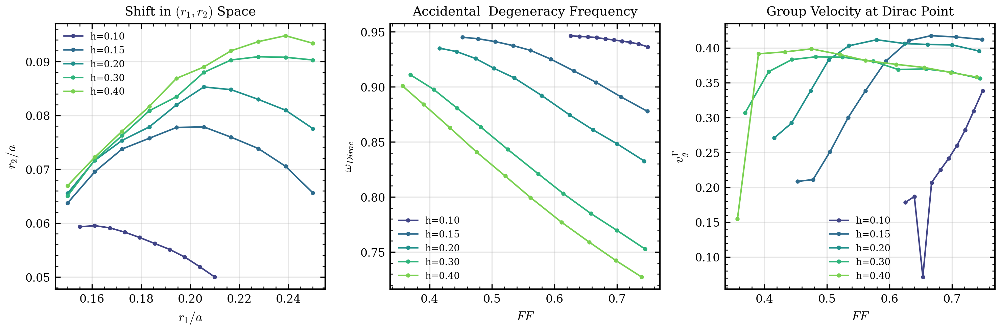

In [106]:


fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10, 3.4))

ms = 2
for i, res in enumerate(slab_optimization_results):
    h = res["h"]
    
    # Extract data
    r1_vals = [entry["r1"] for entry in res["entries"]]
    r2_vals = [entry["r2"] for entry in res["entries"]]

    
    gap = [entry.get("gap", 0) for entry in res["entries"]]
    ax1.plot(r1_vals, r2_vals, color=colors[i], marker='o', markersize=ms, label=f"h={h:.2f}")

    ffs = [entry["filling_factor"] for entry in res["entries"]]
    vgs = [np.linalg.norm(entry["vg_top"]) for entry in res["entries"]]
    omega_dirac = [entry["omega_dirac"] for entry in res["entries"]]


    ax2.plot(ffs, omega_dirac, color=colors[i], marker='o', markersize=ms, label=f"h={h:.2f}")
    ax3.plot(ffs, vgs, color=colors[i], marker='o', markersize=ms, label=f"h={h:.2f}")

# Format Plot 1
ax1.set_xlabel("$r_1/a$")
ax1.set_ylabel("$r_2/a$")
ax1.set_title("Shift in $(r_1, r_2)$ Space")
ax1.legend(loc='best', fontsize='small')
ax1.grid(True, alpha=0.3)

# Format Plot 2
ax2.set_xlabel("$FF$")
ax2.set_ylabel("$\omega_{Dirac}$")
ax2.set_title("Accidental  Degeneracy Frequency")
ax2.set_yscale('linear')
ax2.legend(loc='best', fontsize='small')
ax2.grid(True, alpha=0.3)

# Format Plot 2
ax3.set_xlabel("$FF$")
ax3.set_ylabel("$v_g^{\Gamma}$")
ax3.set_title("Group Velocity at Dirac Point")
ax3.set_yscale('linear')
ax3.legend(loc='best', fontsize='small')
ax3.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

0.155 0.0593186372745491
0.17222222222222222 0.07374749498997996
0.19444444444444445 0.08196392785571142
0.21666666666666667 0.0902805611222445
0.21666666666666667 0.09198396793587174


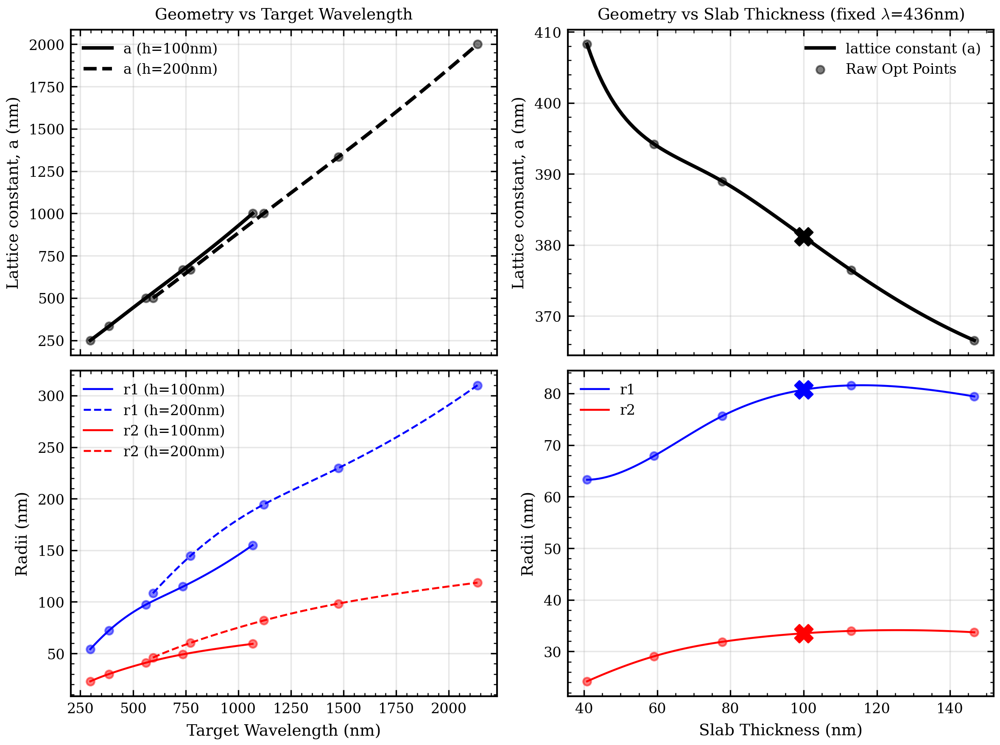

In [136]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# 1. Collect points with highest group velocity for each normalized thickness (h/a)
opt_points = []
for res in slab_optimization_results:
    # Get the index of the entry with the highest group velocity magnitude
    best_idx = np.argmax(res["vg_array"])
    entry = res["entries"][best_idx]
    
    # Retrieve geometrical parameters 
    r1 = entry["r1"]
    r2 = entry.get("r2", entry["r2"])
    print(r1, r2)
    h_norm = entry["h"]
    
    # Compute polar coordinates
    rho = np.sqrt(r1**2 + r2**2)
    phi = np.arctan2(r2, r1)
    
    # Get normalized Dirac frequency
    f_dirac = entry["omega_dirac"]
    
    # The invariant connecting normalized thickness (h_norm) and normalized frequency
    # h/lambda = (h/a) * (a/lambda) = h_norm * f_dirac
    h_over_lambda = h_norm * f_dirac
    
    opt_points.append({
        "h_norm": h_norm,
        "f_dirac": f_dirac,
        "rho": rho,
        "phi": phi,
        "h_over_lambda": h_over_lambda
    })

# 2. Sort by our invariant h/lambda to use it as the X-axis for interpolation
opt_points.sort(key=lambda p: p["h_over_lambda"])

h_over_lam_arr = np.array([p["h_over_lambda"] for p in opt_points])
rho_arr = np.array([p["rho"] for p in opt_points])
phi_arr = np.array([p["phi"] for p in opt_points])
h_norm_arr = np.array([p["h_norm"] for p in opt_points])

# 3. Create cubic interpolators
rho_interp = interp1d(h_over_lam_arr, rho_arr, kind='cubic', fill_value="extrapolate")
phi_interp = interp1d(h_over_lam_arr, phi_arr, kind='cubic', fill_value="extrapolate")
h_norm_interp = interp1d(h_over_lam_arr, h_norm_arr, kind='cubic', fill_value="extrapolate")

def get_design_parameters(target_f_THz, thickness_nm=250):
    """
    Given a target frequency (in THz) and a realistic continuous slab thickness (in nm),
    returns the optimized design parameters (a_nm, r1_nm, r2_nm) mapped linearly.
    """
    c_nm_per_ps = 299792.458  # Speed of light to calculate nm / (1 THz)
    target_lambda_nm = c_nm_per_ps / target_f_THz
    
    # Target scale-invariant h/lambda
    h_over_lam = thickness_nm / target_lambda_nm
    
    # Evaluate interpolated normalized properties
    h_norm = h_norm_interp(h_over_lam)
    rho = rho_interp(h_over_lam)
    phi = phi_interp(h_over_lam)
    
    # Convert back to physical spatial units
    a_nm = thickness_nm / h_norm
    r1_nm = rho * np.cos(phi) * a_nm
    r2_nm = rho * np.sin(phi) * a_nm
    
    return {
        "a_nm": a_nm,
        "r1_nm": r1_nm,
        "r2_nm": r2_nm,
        "h_nm": thickness_nm,
        "lambda_nm": target_lambda_nm,
        "rho_norm": rho,
        "phi_rad": phi
    }

# Setup 2x2 Grid Plot
fig, ((ax1_top, ax2_top), (ax1_bot, ax2_bot)) = plt.subplots(2, 2, figsize=(8, 6), sharex='col')
c_nm_per_ps = 299792.458

# --- Left Column: Dimensions vs Wavelength (h=250nm and h=500nm) ---
# Helper function to generate data over valid wavelength range for a given h
def get_wavelength_sweep_data(fixed_h_nm):
    lam_min = fixed_h_nm / h_over_lam_arr.max()
    lam_max = fixed_h_nm / h_over_lam_arr.min()
    lambdas_nm = np.linspace(lam_min, lam_max, 100)
    a_vals, r1_vals, r2_vals = [], [], []
    for lam in lambdas_nm:
        f_THz = c_nm_per_ps / lam
        design = get_design_parameters(f_THz, thickness_nm=fixed_h_nm)
        a_vals.append(design["a_nm"])
        r1_vals.append(design["r1_nm"])
        r2_vals.append(design["r2_nm"])
    return lambdas_nm, a_vals, r1_vals, r2_vals

h_nm_1 = 100
h_nm_2 = 200

lambdas_nm_1, a_nm_1, r1_nm_1, r2_nm_1 = get_wavelength_sweep_data(h_nm_1)
lambdas_nm_2, a_nm_2, r1_nm_2, r2_nm_2 = get_wavelength_sweep_data(h_nm_2)

ax1_top.plot(lambdas_nm_1, a_nm_1, label="a (h={}nm)".format(h_nm_1), color='black', linewidth=2)
ax1_top.plot(lambdas_nm_2, a_nm_2, label="a (h={}nm)".format(h_nm_2), color='black', linewidth=2, linestyle='--')
ax1_top.set_title("Geometry vs Target Wavelength")
ax1_top.set_ylabel("Lattice constant, a (nm)")
ax1_top.legend()
ax1_top.grid(True, alpha=0.3)

ax1_bot.plot(lambdas_nm_1, r1_nm_1, label="r1 (h={}nm)".format(h_nm_1), color='blue')
ax1_bot.plot(lambdas_nm_2, r1_nm_2, label="r1 (h={}nm)".format(h_nm_2), color='blue', linestyle='--')
ax1_bot.plot(lambdas_nm_1, r2_nm_1, label="r2 (h={}nm)".format(h_nm_1), color='red')
ax1_bot.plot(lambdas_nm_2, r2_nm_2, label="r2 (h={}nm)".format(h_nm_2), color='red', linestyle='--')
ax1_bot.set_xlabel("Target Wavelength (nm)")
ax1_bot.set_ylabel("Radii (nm)")
ax1_bot.legend()
ax1_bot.grid(True, alpha=0.3)

# --- Right Column: Dimensions vs Thickness (Fixed lambda=800nm) ---
fixed_lambda_nm = 436
fixed_f_THz = c_nm_per_ps / fixed_lambda_nm

# Ensure we stay within interpolated valid h_over_lam domain
h_min = h_over_lam_arr.min() * fixed_lambda_nm
h_max = h_over_lam_arr.max() * fixed_lambda_nm

h_vals_nm = np.linspace(h_min, h_max, 100)
a_vals_h, r1_vals_h, r2_vals_h = [], [], []

for h_nm in h_vals_nm:
    design = get_design_parameters(fixed_f_THz, thickness_nm=h_nm)
    a_vals_h.append(design["a_nm"])
    r1_vals_h.append(design["r1_nm"])
    r2_vals_h.append(design["r2_nm"])

ax2_top.plot(h_vals_nm, a_vals_h, label="lattice constant (a)", color='black', linewidth=2)
ax2_top.set_title(f"Geometry vs Slab Thickness (fixed $\lambda$={fixed_lambda_nm}nm)")
ax2_top.set_ylabel("Lattice constant, a (nm)")
ax2_top.legend()
ax2_top.grid(True, alpha=0.3)

ax2_bot.plot(h_vals_nm, r1_vals_h, label="r1", color='blue')
ax2_bot.plot(h_vals_nm, r2_vals_h, label="r2", color='red')
ax2_bot.set_xlabel("Slab Thickness (nm)")
ax2_bot.set_ylabel("Radii (nm)")
ax2_bot.legend()
ax2_bot.grid(True, alpha=0.3)

# =============================================================================
# --- Overlay Raw Optimization Points on the Plots ---
# =============================================================================

# 1. Left Column: Fixed thicknesses (h=100nm and h=200nm)
# Calculate raw physical values assuming h=100nm
raw_lambdas_1 = h_nm_1 / h_over_lam_arr
raw_a_1 = h_nm_1 / h_norm_arr
raw_r1_1 = rho_arr * np.cos(phi_arr) * raw_a_1
raw_r2_1 = rho_arr * np.sin(phi_arr) * raw_a_1

# Calculate raw physical values assuming h=200nm
raw_lambdas_2 = h_nm_2 / h_over_lam_arr
raw_a_2 = h_nm_2 / h_norm_arr
raw_r1_2 = rho_arr * np.cos(phi_arr) * raw_a_2
raw_r2_2 = rho_arr * np.sin(phi_arr) * raw_a_2

# Scatter Left Top (Lattice Constant)
ax1_top.scatter(raw_lambdas_1, raw_a_1, color='black', alpha=0.5, s=20, zorder=5)
ax1_top.scatter(raw_lambdas_2, raw_a_2, color='black', alpha=0.5, s=20, zorder=5)

# Scatter Left Bottom (Radii)
ax1_bot.scatter(raw_lambdas_1, raw_r1_1, color='blue', alpha=0.5, s=20, zorder=5)
ax1_bot.scatter(raw_lambdas_2, raw_r1_2, color='blue', alpha=0.5, s=20, zorder=5)
ax1_bot.scatter(raw_lambdas_1, raw_r2_1, color='red', alpha=0.5, s=20, zorder=5)
ax1_bot.scatter(raw_lambdas_2, raw_r2_2, color='red', alpha=0.5, s=20, zorder=5)


# 2. Right Column: Fixed Wavelength (lambda = 436nm)
# Calculate raw physical values assuming lambda=436nm
raw_h_vals = fixed_lambda_nm * h_over_lam_arr
raw_a_h = raw_h_vals / h_norm_arr
raw_r1_h = rho_arr * np.cos(phi_arr) * raw_a_h
raw_r2_h = rho_arr * np.sin(phi_arr) * raw_a_h

# Scatter Right Top (Lattice Constant)
ax2_top.scatter(raw_h_vals, raw_a_h, color='black', alpha=0.5, s=20, label="Raw Opt Points", zorder=5)
ax2_top.legend() # Refresh legend to include the new scatter label

# Scatter Right Bottom (Radii)
ax2_bot.scatter(raw_h_vals, raw_r1_h, color='blue', alpha=0.5, s=20, zorder=5)
ax2_bot.scatter(raw_h_vals, raw_r2_h, color='red', alpha=0.5, s=20, zorder=5)

# Extract parameters for the slab thickness of 100 nm  and lambda 436
design = get_design_parameters(target_f_THz=c_nm_per_ps/fixed_lambda_nm, thickness_nm=h_nm_1)
# add design points to the plots
ax2_top.scatter(h_nm_1, design["a_nm"], color='k', marker='X', s=100, label="Design Point (λ={}nm)".format(fixed_lambda_nm), zorder=10)
ax2_bot.scatter(h_nm_1, design["r1_nm"], color='blue', marker='X', s=100, label="Design Point r1 (λ={}nm)".format(fixed_lambda_nm), zorder=10)
ax2_bot.scatter(h_nm_1, design["r2_nm"], color='red', marker='X', s=100, label="Design Point r2 (λ={}nm)".format(fixed_lambda_nm), zorder=10)

plt.tight_layout()
plt.show()

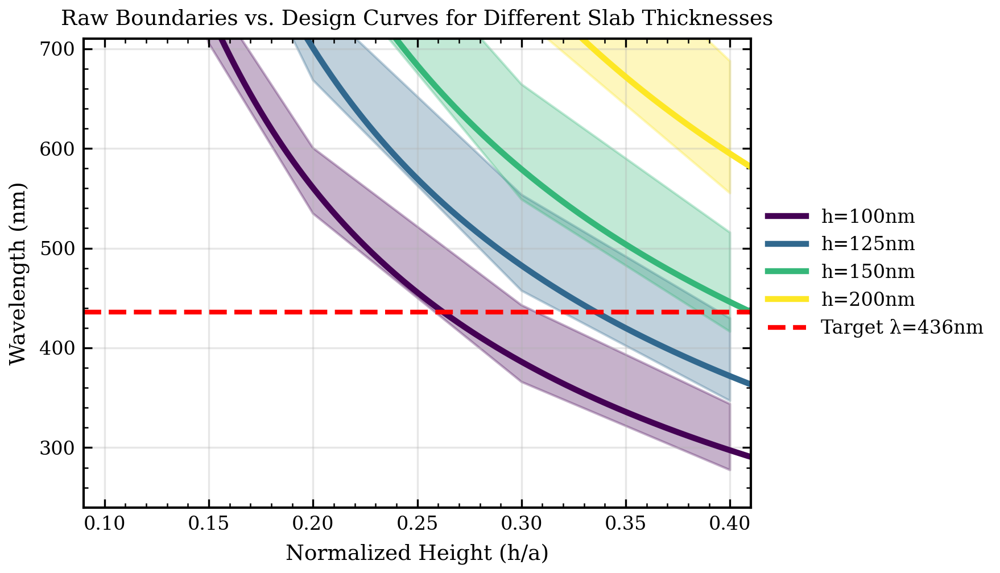

In [144]:
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(6,3.5 ))
target_wavelength_nm = 436
h_nm_array = np.array([100, 125, 150, 200])
colors = plt.get_cmap("viridis", len(h_nm_array))

for i, h_nm in enumerate(h_nm_array):
    # --- 1. Recreate Raw Data Boundaries (The Shaded Regions) ---
    lam_min_array = []
    lam_max_array = []
    h_array = []
    
    for res in slab_optimization_results:
        f_dirac_min = np.min([entry["omega_dirac"] for entry in res["entries"]])
        f_dirac_max = np.max([entry["omega_dirac"] for entry in res["entries"]])
        a_nm = h_nm / res["h"] 
        lam_max_array.append(a_nm / f_dirac_min)
        lam_min_array.append(a_nm / f_dirac_max)
        h_array.append(res["h"])
    
    plt.fill_between(h_array, lam_min_array, lam_max_array, color=colors(i), alpha=0.3)
    
    # --- 2. Plot Interpolated Optimal Trajectory (The Solid Lines) ---
    # We sweep a wide wavelength range covering the entire Y-axis 
    # to see where the interpolation predicts the design should exist.
    lambdas_sweep = np.linspace(240, 710, 200)
    
    # Calculate the scale-invariant parameter for the sweep
    h_over_lams = h_nm / lambdas_sweep
    
    # Predict the required normalized height (h/a) using the cubic interpolator
    h_norms_predicted = h_norm_interp(h_over_lams)
    
    # Filter out extreme extrapolations so the plot remains readable
    valid_idx = (h_norms_predicted >= 0.08) & (h_norms_predicted <= 0.45)
    
    plt.plot(h_norms_predicted[valid_idx], lambdas_sweep[valid_idx], 
             color=colors(i), linewidth=2.5, linestyle='-', 
             label=f"h={h_nm}nm")

# Formatting and Target Line
plt.axhline(target_wavelength_nm, color='red', linestyle='--', linewidth=2, label=f'Target λ={target_wavelength_nm}nm')

plt.title("Raw Boundaries vs. Design Curves for Different Slab Thicknesses")
plt.xlabel("Normalized Height (h/a)")
plt.ylabel("Wavelength (nm)")
plt.xlim(0.09, 0.41)
plt.ylim(240, 710)

# Legend outside the plot
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### Validation

In [147]:
import os
SIMULATE = True
# Define target parameters
target_lambda_nm = 436
c_nm_per_ps = 299792.458
target_f_THz = c_nm_per_ps / target_lambda_nm
thickness_nm = 100

# Retrieve the optimized design geometries from our interpolation 
design = get_design_parameters(target_f_THz, thickness_nm=thickness_nm)

# Print physical dimensions
print("---- Target Physical Dimensions ----")
print(f"Lattice (a): {design['a_nm']:.2f} nm")
print(f"Radius 1:    {design['r1_nm']:.2f} nm")
print(f"Radius 2:    {design['r2_nm']:.2f} nm")
print(f"Thickness:   {design['h_nm']:.2f} nm")

# Convert to normalized units (divided by 'a') for MPB/MEEP
a_nm = design["a_nm"]
r1_norm = design["r1_nm"] / a_nm
r2_norm = design["r2_nm"] / a_nm
h_norm = thickness_nm / a_nm

print("--- Normalized Design Parameters (for MPB/MEEP) ---")
print(f"r1/a: {r1_norm:.3f}")
print(f"r2/a: {r2_norm:.3f}")
print(f"h/a:  {h_norm:.3f}")


# Setup single simulation entry
name_single_sim = f"{name}_single_h{thickness_nm}_lam{target_lambda_nm}"
folder_name = f"{name_single_sim}_r1_{r1_norm:.3f}_r2_{r2_norm:.3f}_h_{h_norm:.3f}"
## Define the simulation
configuration_options_slab_optimized= dict(
    resolution = RESOLUTION_SLAB,
    num_bands=12,
    k_points=k_points_2D_optimized["k_points_values"],
    k_points_interpolation_factor = 10,
    # extra_runner_command = "fix-hfield-phase output-hfield display-symmetries-c6v",
)

mpb_configuration_slab_optimized=MPBSchemeConfigurator(
    photonic_crystal_slab, ["zeven"], **configuration_options_slab_optimized)



sim_single = Simulation(
    simulation_name=folder_name,
    script=mpb_configuration_slab_optimized.get_scheme_config(True),
    directory=os.path.join(data_rooth, folder_name)
)

entry_single = {
    "r1": r1_norm,
    "r2": r2_norm,
    "h": h_norm,
    "sim": sim_single
}

def run_simulation_task_slab(entry, which_sim = "sim", which_param_1 = "r1", which_param_2 = "r2", which_param_3 = "h",  mpi = False, version = "mpb-dev/1.11.2-dev"):
    return entry[which_sim].run_hpc(
        mpb_command_line_params=dict(r1=entry[which_param_1], r2=entry[which_param_2], x_dist = 0.25, h=entry[which_param_3]), 
        mpi=mpi, 
        version=version,
        cores = int(5)
    )



# Run the simulation if permitted
if SIMULATE:
    print(f"\nSubmitting task for '{folder_name}'...")
    run_simulation_task_slab(entry_single, "sim",mpi=True)
    print("Simulation complete.")

visualizer  = SimulationViewer(entry_single["sim"])
df = entry_single["sim"].load_frequency_data(PARITY_SLAB)


---- Target Physical Dimensions ----
Lattice (a): 381.17 nm
Radius 1:    80.72 nm
Radius 2:    33.52 nm
Thickness:   100.00 nm
--- Normalized Design Parameters (for MPB/MEEP) ---
r1/a: 0.212
r2/a: 0.088
h/a:  0.262
COMMANDS ['(define-param h 0.5)', '(define-param r1 0.1)', '(define-param r2 0.2)', '(define-param x_dist 0.25)']

Submitting task for 'C6v_hBN_single_h100_lam436_r1_0.212_r2_0.088_h_0.262'...
Simulation complete.


/tmp/pbs.667432.hnode41/ipykernel_1939955/3344698526.py:6: RuntimeWarning: divide by zero encountered in divide
  lambda_nm = a_nm / df[band].values  # Convert normalized frequency to wavelength in nm


Text(0.5, 1.0, 'Band Structure of Optimized Design\n($a=381nm, r_1=81nm, r_2=34nm, h=100nm$ @ $\\lambda=436nm$)')

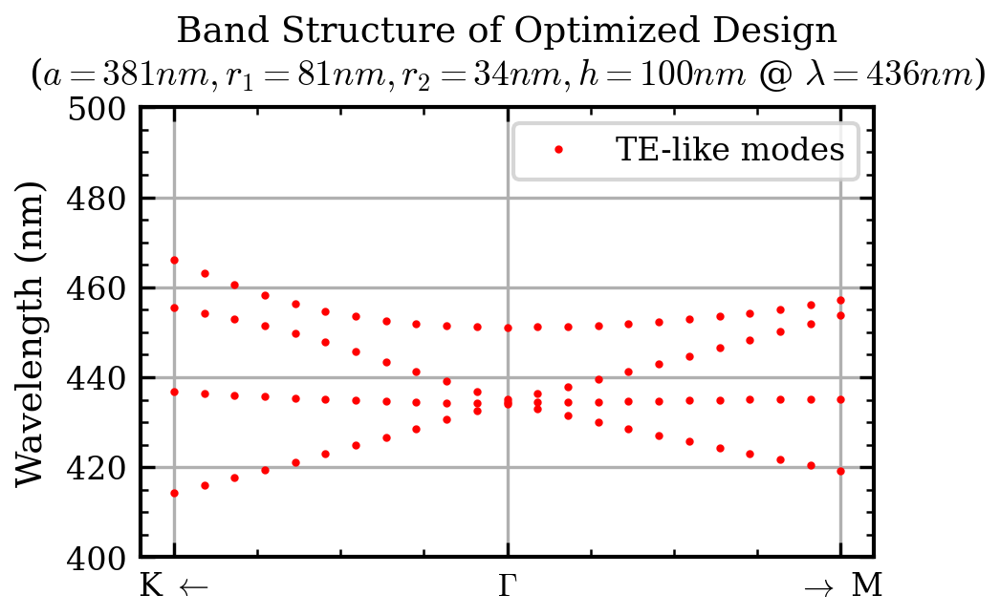

In [148]:
plot_options = dict(linestyle='', marker='o', markersize=1, color='red')

k_indices = df["k index"].values
bands = [f'{PARITY_SLAB} band {i}' for i in range(1,12)]
for i,band in enumerate(bands):
    lambda_nm = a_nm / df[band].values  # Convert normalized frequency to wavelength in nm
    plt.plot(df["k index"], lambda_nm, label=None if i > 0 else "TE-like modes", **plot_options)

plt.ylim(400, 500)
plt.legend(frameon=True)
plt.xticks([1,12,23], k_points_2D_optimized_labels)
plt.grid(True)
plt.ylabel("Wavelength (nm)")
plt.title("Band Structure of Optimized Design\n" +rf"($a={design['a_nm']:.0f}nm, r_1={design['r1_nm']:.0f}nm, r_2={design['r2_nm']:.0f}nm, h={design['h_nm']:.0f}nm$ @ $\lambda={target_lambda_nm}nm$)")

Text(0.5, 1.0, '$C_{6v}:\\;2b \\oplus 6d$')

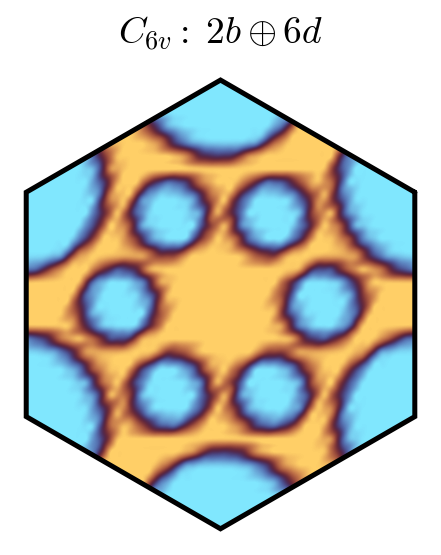

In [161]:
opt_3x3 = MPBDataOptions(rectify = True, periods = (3,3,1), resolution = 65)
epsilon_data = entry_single["sim"].load_and_convert_epsilon_data(opt_3x3)
eps = epsilon_data[:,:,epsilon_data.shape[2]//2]
plt.figure()
plt.gca().set_axis_off()
sv.plot_epsilon_on_ax(eps, "hexagonal", ws_lw = 1.2, padding=1.1, interpolation = "spline36")
plt.title(crystal_symmetries)